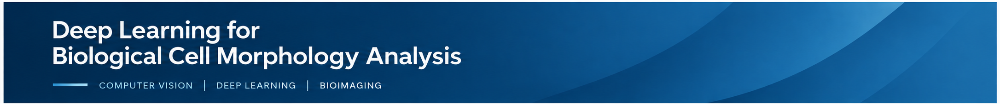

# <center> Deep learning applied to the analysis of morphological changes in biological cells induced by compounds (medicines).
</center>


## **Project Theoretical Framework**
---

The analysis of cellular images using fluorescence microscopy is a fundamental tool in modern biology and drug discovery. These images make it possible to observe subcellular structures such as the nucleus, cytoskeleton, cellular texture, among others.

Biological cells modify their structure when medicines are applied; these modifications may include changes in nucleus size, structure, among others.

The Broad Institute provides biomedical datasets for deep learning analysis that examine how cells react to different compounds, some of which may be derived from cancer patients.

### **1.1. Business Background**
---

The beneficiaries would be scientists and biomedical professionals, students who would have new tools, and developers of new medicines.

The field of application is academia and the development of new medicines. For example, it could enable the early identification of a medicine's effectiveness, among other benefits. It could also improve efficiency in preclinical studies.
And, of course, society, as it helps make the world a better place.


## **2. Broad Institute**
---

In this section, a description of the data should be included along with the code used to process it.



The Broad Institute is an independent, nonprofit research organization whose goal is to discover the fundamental causes of all common and rare diseases and use this knowledge to help develop safe and effective therapeutic interventions.

The Broad Institute is a biomedical and genomic research center located in Cambridge, Massachusetts, United States. The institute is independently governed and operates as a nonprofit research organization under the name Broad Institute Inc., and collaborates with the Massachusetts Institute of Technology (MIT), Harvard University, and five Harvard teaching hospitals.



*   https://www.broadinstitute.org/
*   https://bbbc.broadinstitute.org/BBBC021


### **2.2. Biological Interpretation**
---

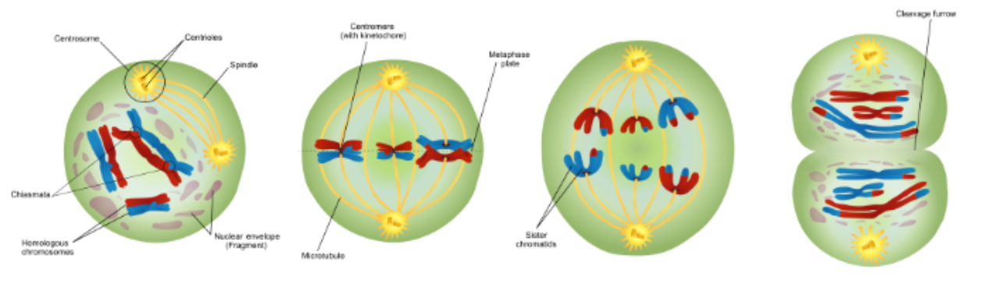

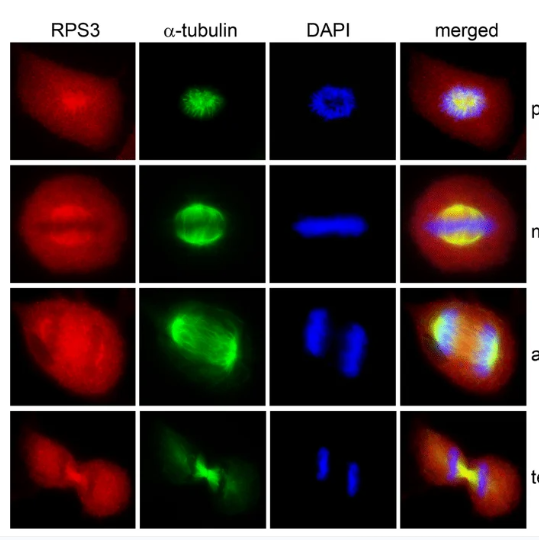

### Scope
---


-Build a deep learning model that uses biological cell images to predict the effects of medicines. This can be done through indicators such as MOA (Mechanism of Action), which describes how a compound (medicine or substance) affects the cell at the biological level.
Benefits include faster treatment selection while avoiding trial and error, as well as improved functional diagnosis, increasing the probability of diagnostic success from the beginning.

In [ ]:
import cv2,glob, matplotlib.pyplot as plt, numpy as np, os,pandas as pd, urllib.request, zipfile
from PIL import Image


In [ ]:
#librerias V3
!pip install tensorflow

In [ ]:
#mas librerias para modelacion V3
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_iris
from sklearn.preprocessing import LabelEncoder
plt.style.use("ggplot")
# Versiones de las librerias usadas. V3
!python --version
print("NumPy:", np.__version__, "tensorflow:",tf.__version__,"keras", keras.__version__)

Python 3.12.13
NumPy: 2.0.2 tensorflow: 2.19.0 keras 3.13.2


In [ ]:
#libreria V3
import cv2,random,time
from tensorflow.keras import layers, models
from keras.utils import plot_model
from pprint import pprint



In [ ]:
#librerias evaluation V4
from sklearn.metrics import f1_score, r2_score, accuracy_score, classification_report
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers.schedules import ExponentialDecay
from tensorflow.keras import layers


In [ ]:
#Constants
DATA_DIR = "bbbc021Data"

WEEKS_CONFIG = {
    "1WeekA": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week1_22123.zip",
    "1WeekB": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week1_22141.zip",
    "1WeekC": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week1_22161.zip",
    "1WeekD": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week1_22361.zip",
    "1WeekE": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week1_22381.zip",
    "1WeekF": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week1_22401.zip",

    "2WeekA": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week2_24121.zip",
    "2WeekB": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week2_24141.zip",
    "2WeekC": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week2_24161.zip",
    "2WeekD": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week2_24361.zip",
    "2WeekE": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week2_24381.zip",
    "2WeekF": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week2_24401.zip",

    "3WeekA": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week3_25421.zip",
    "3WeekB": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week3_25441.zip",
    "3WeekC": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week3_25461.zip",
    "3WeekD": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week3_25681.zip",
    "3WeekE": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week3_25701.zip",
    "3WeekF": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week3_25721.zip",

    "4WeekA": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week4_27481.zip",
    "4WeekB": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week4_27521.zip",
    "4WeekC": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week4_27542.zip",
    "4WeekD": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week4_27801.zip",
    "4WeekE": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week4_27821.zip",
    "4WeekF": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week4_27861.zip",

    "5WeekA": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week5_28901.zip",
    "5WeekB": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week5_28921.zip",
    "5WeekC": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week5_28961.zip",
    "5WeekD": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week5_29301.zip",
    "5WeekE": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week5_29321.zip",
    "5WeekF": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week5_29341.zip",

    "6WeekA": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week6_31641.zip",
    "6WeekB": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week6_31661.zip",
    "6WeekC": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week6_31681.zip",
    "6WeekD": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week6_32061.zip",
    "6WeekE": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week6_32121.zip",
    "6WeekF": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week6_32161.zip",

    "7WeekA": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week7_34341.zip",
    "7WeekB": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week7_34381.zip",
    "7WeekC": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week7_34641.zip",
    "7WeekD": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week7_34661.zip",
    "7WeekE": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week7_34681.zip",

    "8WeekA": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week8_38203.zip",
    "8WeekB": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week8_38221.zip",
    "8WeekC": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week8_38241.zip",
    "8WeekD": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week8_38341.zip",
    "8WeekE": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week8_38342.zip",

    "9WeekA": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week9_39206.zip",
    "9WeekB": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week9_39221.zip",
    "9WeekC": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week9_39222.zip",
    "9WeekD": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week9_39282.zip",
    "9WeekE": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week9_39283.zip",
    "9WeekF": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week9_39301.zip",

    "10WeekA": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week10_40111.zip",
    "10WeekB": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week10_40115.zip",
    "10WeekC": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_images_Week10_40119.zip",
}

CSV_CONFIG = {
    "image": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_image.csv",
    "moa": "https://data.broadinstitute.org/bbbc/BBBC021/BBBC021_v1_moa.csv"
}

IMAGE_FILE_CSV= "image.csv"
MOA_FILE_CSV="moa.csv"

CHANNEL_DIC = {
    "DAPI": {
        "col": "Image_FileName_DAPI",
        "rgbIndex": 2,
        "color": (0, 0, 1)
    },
    "Tubulin": {
        "col": "Image_FileName_Tubulin",
        "rgbIndex": 1,
        "color": (0, 1, 0)
    },
    "Actin": {
        "col": "Image_FileName_Actin",
        "rgbIndex": 0,
        "color": (1, 0, 0)
    },
    "RGB": {
        "col": None,
        "rgbIndex": None,
        "color": None
    }
}

#Input

In [ ]:
#Input
def downloadFile(url, path, overwrite=False):
    if overwrite or not os.path.exists(path):
        print(f"Descargando {os.path.basename(path)}...")
        urllib.request.urlretrieve(url, path)
    else:
        print(f"{os.path.basename(path)} ya existe.")

def extractZip(zipPath, extractPath):
    if not os.path.exists(extractPath):
        print("Descomprimiendo...")
        with zipfile.ZipFile(zipPath, 'r') as zipRef:
            zipRef.extractall(extractPath)
    else:
        print("Ya descomprimido.")

In [ ]:
#DataCsv
def loadCsvFiles(DATA_DIR, CSV_CONFIG, IMAGE_FILE_CSV, MOA_FILE_CSV):

    fileMap = {
        IMAGE_FILE_CSV: CSV_CONFIG["image"],
        MOA_FILE_CSV: CSV_CONFIG["moa"]
    }

    filePaths = {}

    # Descarga
    for name, url in fileMap.items():
        path = os.path.join(DATA_DIR, name)
        downloadFile(url, path, overwrite=False)
        filePaths[name] = path

    # Carga
    dfImg = pd.read_csv(filePaths[IMAGE_FILE_CSV])
    dfMoa = pd.read_csv(filePaths[MOA_FILE_CSV])

    return dfImg, dfMoa

def mergeMetadata(
    dfImg,
    dfMoa,
    compoundColImg="Image_Metadata_Compound",
    concColImg="Image_Metadata_Concentration",
    compoundColMoa="compound",
    concColMoa="concentration"
):
    dfImgInicial = len(dfImg)
    dfMoaInicial = len(dfMoa)

    dfImg[compoundColImg] = dfImg[compoundColImg].astype(str).str.strip().str.lower()
    dfMoa[compoundColMoa] = dfMoa[compoundColMoa].astype(str).str.strip().str.lower()

    dfImg[concColImg] = dfImg[concColImg].astype(float).round(4)
    dfMoa[concColMoa] = dfMoa[concColMoa].astype(float).round(4)

    dfMerged = dfImg.merge(
        dfMoa,
        left_on=[compoundColImg, concColImg],
        right_on=[compoundColMoa, concColMoa],
        how="left"
    )

    dfMerged["moa"] = dfMerged["moa"].fillna("NO_MATCH")

    reportMerged = {
        "dfImgInicial": dfImgInicial,
        "dfMoaInicial": dfMoaInicial,
        "dfMerged": len(dfMerged),
        "noMatch": (dfMerged["moa"] == "NO_MATCH").sum(),
        "matched": (dfMerged["moa"] != "NO_MATCH").sum()
    }
    # print("dfCheck:",dfCheck["_merge"].value_counts())
    return dfMerged,reportMerged

def prepareImageData(DATA_DIR, WEEKS_CONFIG):
    os.makedirs(DATA_DIR, exist_ok=True)
    for weekName, url in WEEKS_CONFIG.items():

        zipPath = os.path.join(DATA_DIR, f"{weekName}.zip")
        extractPath = os.path.join(DATA_DIR, weekName)

        downloadFile(url, zipPath, overwrite=False)

        if not os.path.exists(extractPath):
            with zipfile.ZipFile(zipPath, 'r') as zipRef:
                zipRef.extractall(extractPath)

def buildImageIndex(basePath):
    allImages = glob.glob(os.path.join(basePath, "**/*.tif"), recursive=True)
    imageDict = {os.path.basename(p): p for p in allImages}
    print("-"*100)
    print("imageDict size:", len(imageDict))
    return imageDict

def buildLongFormatDf(df, CHANNEL_DIC):
    records = []


    for _, row in df.iterrows():

        for channel_name, channelInfo in CHANNEL_DIC.items():
            filename = row[channelInfo["col"]]

            site = None
            if "_s" in filename:
                try:
                    site = filename.split("_s")[1].split("_")[0]
                except:
                    site = None

            records.append({
                "compound": row["compound"],
                "concentration": row["concentration"],
                "moa": row["moa"],
                "plate": row["plate"],
                "well": row["well"],
                "site": site,
                "replicate": row["replicate"],
                "channel": channel_name,
                "image_id": f"{row['plate']}_{row['well']}_{site}",
                "filename": filename
            })

    return pd.DataFrame(records)

def buildGlobalImageIndex(dataDir):
    allImages = glob.glob(os.path.join(dataDir, "**/*.tif"), recursive=True)

    imageDict = {}

    for p in allImages:
        fname = os.path.basename(p)

        try:
            with Image.open(p) as img:
                size = img.size  # (width, height)
        except:
            size = None

        if fname not in imageDict:
            imageDict[fname] = []

        imageDict[fname].append({
            "path": p,
            "size": size
        })

    return imageDict

def checkImageMarchWithImageDict(row, imageDict):
    return (
        row[CHANNEL_DIC["DAPI"]["col"]] in imageDict and
        row[CHANNEL_DIC["Tubulin"]["col"]] in imageDict and
        row[CHANNEL_DIC["Actin"]["col"]] in imageDict
    )

#V4
def adjumnetDfPos(df, imageDict):
    df["matchImage"] = df.apply(
        lambda row: checkImageMarchWithImageDict(row, imageDict),
        axis=1
    )

    dfPosAdjument = df[df["matchImage"]]

    dfPosAdjument = dfPosAdjument.reset_index().rename(columns={"index": "original_index"})
    dfPosAdjument["pos"] = dfPosAdjument.index
    return dfPosAdjument


def filterAndValidateByWeekAndChannel(df, imageDict, channelDic):

    df = df.copy()

    col = channelDic["DAPI"]["col"]
    df["week"] = df[col].astype(str).str.lower().str.extract(r'(week\d+)')

    df = df[df["week"].notna()]

    reportRows = []

    filteredChannels = {
        chName: chInfo
        for chName, chInfo in channelDic.items()
        if chName.lower() != "rgb"
    }

    # Iterar por semana
    for week, dfWeek in df.groupby("week"):

        rowReport = {"Week": week}

        totalRows = len(dfWeek)

        for chName, chInfo in filteredChannels.items():

            colName = chInfo["col"]
            matchCount = 0

            for _, row in dfWeek.iterrows():

                if colName not in row or pd.isna(row[colName]):
                    continue

                if checkImageMarchWithImageDict(row, imageDict):
                    matchCount += 1

            rowReport[chName] = totalRows
            rowReport[f"{chName}_match"] = matchCount

        reportRows.append(rowReport)

    reportValidation = pd.DataFrame(reportRows).sort_values("Week").reset_index(drop=True)

    totalsRow = {"Week": "TOTAL"}

    for col in reportValidation.columns:
        if col != "Week":
            totalsRow[col] = reportValidation[col].sum()

    reportValidation = pd.concat([reportValidation, pd.DataFrame([totalsRow])], ignore_index=True)

    return df, reportValidation

In [ ]:
#VisualizationImages
def getImagePaths(row, imageDict):

    def pickOne(filename):
        entries = imageDict.get(filename, None)

        if entries is None:
            raise ValueError(f"Imagen no encontrada: {filename}")

        if not isinstance(entries, list):
            entries = [entries]

        entry = entries[0]

        if isinstance(entry, dict):
            return entry["path"]
        elif isinstance(entry, str):
            return entry

    return (
        pickOne(row[CHANNEL_DIC["DAPI"]["col"]]),
        pickOne(row[CHANNEL_DIC["Tubulin"]["col"]]),
        pickOne(row[CHANNEL_DIC["Actin"]["col"]])
    )

def normalizeImage(img, tipo=2):

    img = np.asarray(img).astype(float)
    if img.ndim == 2: #Escala de Grises

        if tipo == 1:  # Min-Max
            return (img - img.min()) / (img.max() - img.min() + 1e-8)

        elif tipo == 2:  # Percentiles
            p1, p99 = np.percentile(img, (1, 99))
            img = np.clip(img, p1, p99)
            return (img - p1) / (p99 - p1 + 1e-8)
        elif img.ndim == 3: RGB (H, W, 3)

        imgOut = np.zeros_like(img)

        for c in range(img.shape[2]):
            channel = img[..., c]

            if tipo == 1:
                normChannel = (channel - channel.min()) / (channel.max() - channel.min() + 1e-8)

            elif tipo == 2:
                p1, p99 = np.percentile(channel, (1, 99))
                channel = np.clip(channel, p1, p99)
                normChannel = (channel - p1) / (p99 - p1 + 1e-8)

            imgOut[..., c] = normChannel

        return imgOut

    else:
        raise ValueError("Formato de imagen no soportado")
def loadChannels(dapiPath, tubulinPath, actinPath):
    dapi = normalizeImage(Image.open(dapiPath),2)
    tubulin = normalizeImage(Image.open(tubulinPath),2)
    actin = normalizeImage(Image.open(actinPath),2)
    return dapi, tubulin, actin

def createRgbImage(dapi, tubulin, actin):
    rgb = np.zeros((dapi.shape[0], dapi.shape[1], 3))
    rgb[..., 2] = dapi
    rgb[..., 1] = tubulin
    rgb[..., 0] = actin
    return rgb

def visualizeImages(imagePaths, cols=5):
    rows = int(np.ceil(len(imagePaths) / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(15, 3 * rows))
    axes = axes.flatten()

    for i, path in enumerate(imagePaths):
        img = np.array(Image.open(path))
        img = normalizeImage(img)

        axes[i].imshow(img, cmap="gray")
        axes[i].set_title(f"Img {i+1}")
        axes[i].axis("off")

    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()


def plotSingleChannel(ax, img, title, cmap):
    ax.imshow(img, cmap=cmap)
    ax.set_title(title)
    ax.axis("off")


def plotRGB(ax, rgb, title):
    ax.imshow(rgb)
    ax.set_title(title)
    ax.axis("off")

def plotImages4Images3ChanelsCombine(dapi, tubulin, actin, rgb, moa):
    fig, axes = plt.subplots(1, 4, figsize=(12, 4))

    plotSingleChannel(axes[0], dapi, "DAPI", "Blues")
    plotSingleChannel(axes[1], tubulin, "Tubulin", "Greens")
    plotSingleChannel(axes[2], actin, "Actin", "Reds")
    plotRGB(axes[3], rgb, f"MOA: {moa}")

    plt.tight_layout()
    plt.show()

def getChannelImage(dapi, tubulin, actin, channel):
    if channel == "RGB":
        return createRgbImage(dapi, tubulin, actin)
    images = [actin, tubulin, dapi]
    idx = CHANNEL_DIC[channel]["rgbIndex"]
    return images[idx]

def toColor(img, channel):
    if channel == "RGB":
        return img
    rgb = np.zeros((*img.shape, 3))
    idx = CHANNEL_DIC[channel]["rgbIndex"]
    rgb[..., idx] = img
    return rgb

def plotZoomDualFromIndex( df,    rowIndex,imageDict,channel,center=None,zoomSize=None,zoomX=None):

    if rowIndex >= len(df):
        raise IndexError(f"rowIndex {rowIndex} fuera de rango")

    if zoomX is not None and zoomSize is not None:
        raise ValueError("Usa solo zoomSize o zoomX, no ambos")

    row = df.iloc[rowIndex]

    print(f"compound: {row['compound']}")
    print(f"moa: {row['moa']}")
    print(f"concentration: {row['concentration']}")
    print("-" * 50)

    dapiPath, tubulinPath, actinPath = getImagePaths(row, imageDict)
    dapi, tubulin, actin = loadChannels(dapiPath, tubulinPath, actinPath)

    if channel == "RGB":
        img = createRgbImage(dapi, tubulin, actin)
        h, w, _ = img.shape
    else:
        img = getChannelImage(dapi, tubulin, actin, channel)
        h, w = img.shape

    if zoomX is not None:
        zoomSize = int(min(h, w) / zoomX)

    if zoomSize is None:
        zoomSize = 100

    if center is None:
        cy, cx = h // 2, w // 2
    else:
        cy, cx = center
        if 0 <= cy <= 1 and 0 <= cx <= 1:
            cy = int(cy * h)
            cx = int(cx * w)
        else:
            cy = int(cy)
            cx = int(cx)

    half = zoomSize // 2

    y1 = max(cy - half, 0)
    y2 = min(cy + half, h)
    x1 = max(cx - half, 0)
    x2 = min(cx + half, w)

    zoomImg = img[y1:y2, x1:x2]

    if channel == "RGB":
        imgNorm = img
        zoomNorm = zoomImg
        imgColor = imgNorm
        zoomColor = zoomNorm
    else:
        imgNorm = normalizeImage(img)
        zoomNorm = normalizeImage(zoomImg)

        imgColor = toColor(imgNorm, channel)
        zoomColor = toColor(zoomNorm, channel)

    imgRect = imgColor.copy()
    cv2.rectangle(imgRect, (x1, y1), (x2, y2), (1, 1, 0), 2)

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    axes[0].imshow(imgRect)
    axes[0].set_title(f"{channel} - Full Image")
    axes[0].axis("off")

    zoom_title = f"Zoom ({cy},{cx})"
    if zoomX is not None:
        zoom_title += f" | {zoomX}x"

    axes[1].imshow(zoomColor)
    axes[1].set_title(zoom_title)
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

def buildImageFromRow(row, imageDict, targetSize=(224,224)):
    # import cv2

    dapiPath, tubulinPath, actinPath = getImagePaths(row, imageDict)
    dapi, tubulin, actin = loadChannels(dapiPath, tubulinPath, actinPath)

    rgbOriginal = createRgbImage(dapi, tubulin, actin)

    rgbModel = cv2.resize(rgbOriginal, targetSize)
    rgbModel = rgbModel / 255.0

    return rgbModel, rgbOriginal, dapi, tubulin, actin

In [ ]:
#Images desc.
def imgDesc():
    os.makedirs(DATA_DIR, exist_ok=True)
    for weekName, url in WEEKS_CONFIG.items():
        zipPath = os.path.join(DATA_DIR, f"{weekName}.zip")
        extractPath = os.path.join(DATA_DIR, weekName)
        downloadFile(url, zipPath)
        extractZip(zipPath, extractPath)
        totalPaths = glob.glob(os.path.join(extractPath, "**/*.tif"), recursive=True)
        print(f"The leng of totalPaths of {weekName} is : ",len(totalPaths))
    return totalPaths


In [ ]:
#Estadisticas globales
def getImageStats(imageDict, dfMoa, dfImg):
    totalFiles = 0
    sizeCounter = {}
    duplicates = []

    for fname, entries in imageDict.items():

        if not isinstance(entries, list):
            entries = [entries]

        totalFiles += len(entries)

        if len(entries) > 1:
            duplicates.append({
                "filename": fname,
                "count": len(entries)
            })

        for e in entries:
            if isinstance(e, dict):
                size = e.get("size", None)
            else:
                size = None

            if size:
                sizeCounter[size] = sizeCounter.get(size, 0) + 1

        uniquedfMoaCompound = list(set(dfMoa["compound"].unique()))
        uniqueImgCompound=dfImg["Image_Metadata_Compound"].unique()
        unknownCompoundDfImg = (dfImg["Image_Metadata_Compound"]=="UNKNOWN").sum()

    report = {
        "totalFiles": totalFiles,
        "uniqueFiles": len(imageDict),
        "numDuplicates": len(duplicates),
        "duplicatesDetail": duplicates[:10],  # sample
        "sizeDistribution": sizeCounter,
        "topSizes": sorted(sizeCounter.items(), key=lambda x: -x[1])[:5],
        "uniquedfMoaCompound":uniquedfMoaCompound,
        "uniqueImgCompound":uniqueImgCompound,
        "unknownCompoundDfImg":unknownCompoundDfImg

    }

    return report

In [ ]:
#Reports

def printMergeSummary(reportMerged, dfFinal):
    print("-" * 50)
    print("Merge report")
    print("-" * 50)
    for k, v in reportMerged.items():
        print(f"{k}: {v}")

    print("\ndfFinal:", len(dfFinal))


def reportDF(df: pd.DataFrame, name): #V4
    print(f"===== REPORTE DEL DATAFRAME : {name} =====\n")
    print(f"Total de filas: {len(df)}")
    print(f"len imageDict : {len(imageDict)}\n")

    columnas = df.columns.tolist()

    print(f"Existe'matchImage    column: {'matchImage' in columnas}")
    print(f"Existe week          column: {'week' in columnas}")
    print(f"Existe compound      column: {'compound' in columnas}")
    print(f"Existe concentration column: {'concentration' in columnas}")
    print(f"Existe moa           column: {'moa' in columnas}")

    if 'moa' in columnas:
        print(f"Numero de Matches  en moa column      : {(df['moa'] != 'NO_MATCH').sum()}")
        print(f"Numero de NO_MATCH en moa column      : {(df['moa'] == 'NO_MATCH').sum()}")
    else:
        print("No existe la columna 'moa'")

    if 'compound' in columnas:
        print(f"Numero de NaN en compound column      : {df['compound'].isna().sum()}")
    else:
        print("No existe la columna 'compound'")

    if 'concentration' in columnas:
        print(f"Numero de NaN en concentration column : {df['concentration'].isna().sum()}")
    else:
        print("No existe la columna 'compound'")

    if 'week' in columnas:
        print("Si existe la columna week")
        print("Elementos por semana               :")
        print(df['week'].value_counts().sort_index(), "")
    else:
        print("No existe la columna 'week'")



    columnasConNan = df.columns[df.isna().any()].tolist()

    columnasConVacios = []
    for col in df.columns:
        if df[col].dtype == 'object':
            if (df[col] == '').any():
                columnasConVacios.append(col)

    columnasProblematicas = list(set(columnasConNan + columnasConVacios))

    print("Columnas con al menos un NaN o valor vacío:")
    print(columnasProblematicas if columnasProblematicas else "Ninguna")
    print("\n===== FIN DEL REPORTE =====")


def reportProptertiesVector(vec):
  print(f"Propiedades")
  print(f"type    :",type(vec))
  print(f"shape   :", vec.shape)
  print(f"dtype   :", vec.dtype)
  print(f"nbytes  : {round(vec.nbytes / (1024 ** 2), 2)} Mb" )
  print("-"*50)

def reportClasses(df, countColumn, encoder):
    # Conteo de clases original
    conteo = df[countColumn].value_counts()

    # Extraer del encoder
    yTrainEnc = encoder["yTrainEnc"]
    yValEnc   = encoder["yValEnc"]
    yTestEnc  = encoder["yTestEnc"]
    numClasses = encoder["numClasses"]
    labelEncoder = encoder["labelEncoder"]

    total = len(yTrainEnc) + len(yValEnc) + len(yTestEnc)

    print(conteo)
    print("-" * 100)

    print("numClasses :", numClasses)
    # print("classes    :", list(labelEncoder.classes_))
    print("-" * 100)

    print(f"len yTrainEnc   : {len(yTrainEnc)}   ({round(len(yTrainEnc)/total, 2)})")
    print(f"len yValEnc     : {len(yValEnc)}     ({round(len(yValEnc)/total, 2)})")
    print(f"len yTestEnc    : {len(yTestEnc)}    ({round(len(yTestEnc)/total, 2)})")
    print("-" * 100)

    print(f"total encoder y : {total}")

def countValidImagesByWeek(dfMerged, channelDic): #revisa cuantas imagenes con MOA son validads, por semana
    df = dfMerged.copy()
    df = df[df["moa"] != "NO_MATCH"]
    col = channelDic["DAPI"]["col"]
    df["week"] = df[col].astype(str).str.lower().str.extract(r'(week\d+)')

    df = df[df["week"].notna()]

    reportDf = (
        df.groupby("week")
        .size()
        .reset_index(name="Num_images")
        .sort_values("week")
        .reset_index(drop=True)
    )

    totalRow = pd.DataFrame([{
        "week": "TOTAL",
        "Num_images": reportDf["Num_images"].sum()
    }])

    reportDf = pd.concat([reportDf, totalRow], ignore_index=True)

    return reportDf


In [ ]:
#Utils
def endTimeRunning(start): #V4
  end = time.perf_counter()
  tiempo = end - start
  print(f"Tiempo de ejecución: {tiempo:.4f} segundos")
  print(f"Tiempo de ejecución: {tiempo / 60:.4f} minutos")


In [ ]:
#Main
start = time.perf_counter()

totalPath = imgDesc()
def main1A(filterNoMatch= True):
    prepareImageData(DATA_DIR, WEEKS_CONFIG)

    imageDict = buildGlobalImageIndex(DATA_DIR)

    dfImg, dfMoa = loadCsvFiles(DATA_DIR, CSV_CONFIG, IMAGE_FILE_CSV, MOA_FILE_CSV)

    dfMerged, reportMerged = mergeMetadata(dfImg, dfMoa)

    reportStatImages = getImageStats(imageDict, dfMoa, dfImg)

    dfFiltered, channelReportDf = filterAndValidateByWeekAndChannel(
        dfMerged,
        imageDict,
        CHANNEL_DIC
    )

    dfFinal = adjumnetDfPos(dfFiltered, imageDict)

    if filterNoMatch:
      dfFinal = dfFinal[dfFinal["moa"] != "NO_MATCH"].copy()

    printMergeSummary(reportMerged, dfFinal)

    print("-"*50)
    print("\nReporte imagens folders colab (week × channel):")
    print("-"*50)
    print(channelReportDf)

    return (
        dfFiltered,
        dfFinal,
        imageDict,
        reportMerged,
        reportStatImages,
        channelReportDf,
        dfImg,
        dfMoa,
        dfMerged
    )

dfFiltered, dfFinal, imageDict, reportMerged, reportStatImages, channelReportDf, dfImg, dfMoa, dfMerged = main1A(filterNoMatch=True)

endTimeRunning(start)

Descargando 1WeekA.zip...
Descomprimiendo...
The leng of totalPaths of 1WeekA is :  720
Descargando 1WeekB.zip...
Descomprimiendo...
The leng of totalPaths of 1WeekB is :  720
Descargando 1WeekC.zip...
Descomprimiendo...
The leng of totalPaths of 1WeekC is :  720
Descargando 1WeekD.zip...
Descomprimiendo...
The leng of totalPaths of 1WeekD is :  720
Descargando 1WeekE.zip...
Descomprimiendo...
The leng of totalPaths of 1WeekE is :  720
Descargando 1WeekF.zip...
Descomprimiendo...
The leng of totalPaths of 1WeekF is :  720
Descargando 2WeekA.zip...
Descomprimiendo...
The leng of totalPaths of 2WeekA is :  720
Descargando 2WeekB.zip...
Descomprimiendo...
The leng of totalPaths of 2WeekB is :  720
Descargando 2WeekC.zip...
Descomprimiendo...
The leng of totalPaths of 2WeekC is :  720
Descargando 2WeekD.zip...
Descomprimiendo...
The leng of totalPaths of 2WeekD is :  720
Descargando 2WeekE.zip...
Descomprimiendo...
The leng of totalPaths of 2WeekE is :  720
Descargando 2WeekF.zip...
Descom

In [ ]:
# reportDF(dfImg,"dfImg")
# reportDF(dfMerged,"dfMerged")
# reportDF(dfFiltered,"dfFiltered")
reportDF(dfFinal,"dfFiltered") #V4



===== REPORTE DEL DATAFRAME : dfFiltered =====

Total de filas: 3416
len imageDict : 39600

Existe'matchImage    column: True
Existe week          column: True
Existe compound      column: True
Existe concentration column: True
Existe moa           column: True
Numero de Matches  en moa column      : 3416
Numero de NO_MATCH en moa column      : 0
Numero de NaN en compound column      : 0
Numero de NaN en concentration column : 0
Si existe la columna week
Elementos por semana               :
week
week1     516
week10    240
week2     360
week3     636
week5     324
week6     300
week7     340
week8     292
week9     408
Name: count, dtype: int64 
Columnas con al menos un NaN o valor vacío:
Ninguna

===== FIN DEL REPORTE =====


In [ ]:
#Categorias
def getFirstRecordsByMoaWithIndex(moaList, df, moaCol="moa"): #V4
    resultDict = {}

    for moa in moaList:
        subsetDf = df[df[moaCol] == moa]

        if not subsetDf.empty:
            firstIndex = subsetDf.index[0]
            resultDict[moa] = {
                "rowIndex": firstIndex,
                "rowData": subsetDf.iloc[0].to_dict()
            }
        else:
            resultDict[moa] = None

    return resultDict

def showCuartetosFromResultDict(resultDict, dfFinal):
    for moa, data in resultDict.items():
        if data is not None:
          if moa != "NO_MATCH":
            rowIndex = data["rowIndex"]
            print(f"\nMostrando MOA: {moa} | rowIndex: {rowIndex}")
            cuartetoRaw(dfFinal, rowIndex=rowIndex)
        else:
            print(f"\nNo hay datos para MOA: {moa}")

In [ ]:
# resultDict = getFirstRecordsByMoaWithIndex(dfFinal["moa"].unique(), dfFinal)
# showCuartetosFromResultDict(resultDict, dfFinal)

In [ ]:
#Preprocesameinto
def preprocessSingleChannel(imgDict, path, targetSize=(224, 224)):

    #Validaciones
    if path is None or (isinstance(path, float) and np.isnan(path)):
        return None

    entry = imgDict.get(path, None)

    if entry is None:
        return None

    if isinstance(entry, list):
        entry = entry[0]

    if isinstance(entry, dict):
        imgPath = entry["path"]   # formato principal

    elif isinstance(entry, str):
        imgPath = entry           # fallback si fuera string
    else:
        return None
    if imgPath is None:
        return None

    try:
        img = np.array(Image.open(imgPath))
    except:
        return None

    if img.size == 0:
        return None

    #  Redimensionar la imagen al tamano objetivo
    img = cv2.resize(img, targetSize, interpolation=cv2.INTER_AREA)

    # Normalización robusta (percentiles 1–99)
    img = normalizeImage(img, tipo=2)
    return img

def cuartetosPreProcesados(dfFinal, imgDict, rowIndex=None, channels=["DAPI", "Tubulin", "Actin"], targetSize=(224, 224)):
    if rowIndex is None:
        rowIndex = random.randint(0, len(dfFinal) - 1)

    row = dfFinal.iloc[rowIndex]
    imgs = preprocessRow(row, imgDict, channels, targetSize)

    dapi, tubulin, actin = imgs

    rgb = createRgbImage(dapi, tubulin, actin)

    print(f"Row: {rowIndex} | MOA: {row['moa']}")

    plotImages4Images3ChanelsCombine(
        dapi, tubulin, actin, rgb, row["moa"]
    )

def cuartetoTensor(img, moa=None):

    import numpy as np

    img = np.clip(img, 0, 1)

    dapi = img[:, :, 0]
    tubulin = img[:, :, 1]
    actin = img[:, :, 2]

    rgb = createRgbImage(dapi, tubulin, actin)

    plotImages4Images3ChanelsCombine(
        dapi, tubulin, actin, rgb, moa
    )

    return rgb

def cuartetoRaw(df, rowIndex=0, imageDict=None):

    row = df.iloc[rowIndex]

    rgb, dapi, tubulin, actin = buildImageFromRow(row, imageDict)

    plotImages4Images3ChanelsCombine(
        dapi, tubulin, actin, rgb, row["moa"]
    )

    return rgb




# **Data Understanding and Preparation**
---
---

##  1. Exploratory Analysis
---



### **1.1. General Overview**
---

The Broad Institute database contains 39,600 image files, 13,200 of them in TIFF format. They are provided in ZIP files of approximately 750 MB each, with approximately 720 images per file, and are separated by week.

Reviewing the metadata files provided by the Broad Institute, there are two CSV files: one containing the list of images and another containing the classification of the medicines and the MOA (Mechanism of Action) label. Each of them has the following size:

In [ ]:
print("Numero de filas df de imagenes        :", reportMerged["dfImgInicial"])
print("Numero de filas df de MOA             :", reportMerged["dfMoaInicial"])


Numero de filas df de imagenes        : 13200
Numero de filas df de MOA             : 104


The biological image metadata CSV file contains the following columns. Of particular note is the use of different stains, DAPI, Tubulin, and Actin, for each sample; these stains can be separated into different color channels.

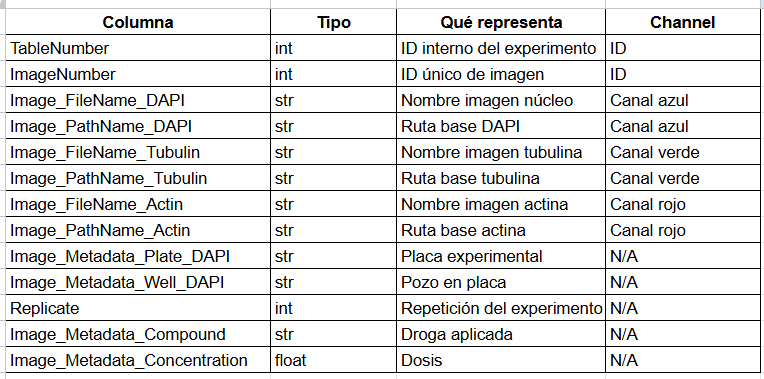

| Visual signal         | Interpretation             |
| -------------------- | -------------------------- |
| Fragmented nucleus   | aging / apoptosis |
| Disorganized actin | structural loss        |
| Disrupted tubulin        | cellular dysfunction         |
| Irregular shape      | senescence                |


In [ ]:
print("Columnas del dfImg:",dfImg.columns)

Columnas del dfImg: Index(['TableNumber', 'ImageNumber', 'Image_FileName_DAPI',
       'Image_PathName_DAPI', 'Image_FileName_Tubulin',
       'Image_PathName_Tubulin', 'Image_FileName_Actin',
       'Image_PathName_Actin', 'Image_Metadata_Plate_DAPI',
       'Image_Metadata_Well_DAPI', 'Replicate', 'Image_Metadata_Compound',
       'Image_Metadata_Concentration'],
      dtype='object')


The MOA (Mechanism of Action) metadata contains three columns: compound, concentration, and MOA. In this case, MOA is a label based on visual identification from the experiment; some effects are very subtle, so the labels are also based on prior knowledge from the literature.

In [ ]:
display("Head dfMoa:",dfMoa.head(1))
print("Columnas del dfMoa:",dfMoa.columns)

'Head dfMoa:'

,compound,concentration,moa
0,pp-2,3.0,Epithelial


Columnas del dfMoa: Index(['compound', 'concentration', 'moa'], dtype='object')


In [ ]:
print(dfMoa["moa"].unique())

['Epithelial' 'Protein synthesis' 'Aurora kinase inhibitors'
 'Actin disruptors' 'Protein degradation' 'DNA replication'
 'Eg5 inhibitors' 'Microtubule stabilizers' 'DNA damage'
 'Kinase inhibitors' 'Microtubule destabilizers' 'Cholesterol-lowering'
 'DMSO']


| Name segment | Extracted value                       | Meaning                                |
| ------------------- | ------------------------------------ | ------------------------------------------ |
| Week              | Week1                                | Experiment week (biological replicate) |
| Date               | 150607                               | 2015-06-07 (YYMMDD format)                |
| Well         | E08                                  | Row E, column 8 of the plate              |
| Site        | s2                                   | Field of view within the well            |
| Channel     | w1                                   | Fluorescence channel (DAPI - nucleus)     |
| UUID                | 83F66AC4-1C15-4ABA-BD33-06D188AD670E | Unique image identifier           |


### **1.2. Data Quality Summary**
---

The dfImg image dataset contains the experiment (raw data), while dfMoa contains the biological interpretation (MOA). Not all conditions have a known interpretation. Only some compounds have known MOAs.

The image dataset was joined with the compound dataset labeled with MOA. Not all images have a biological interpretation or possible label.

In [ ]:
print("Numero de filas df de imagenes                   :", reportMerged["dfImgInicial"])
print("Numero de filas df de MOA                        :", reportMerged["dfMoaInicial"])
print("Numero de filas df de la interseccion con Match  :", reportMerged["matched"])
print("Numero de filas df de la interseccion NO_MATCH   :(", reportMerged["noMatch"])


Numero de filas df de imagenes                   : 13200
Numero de filas df de MOA                        : 104
Numero de filas df de la interseccion con Match  : 3848
Numero de filas df de la interseccion NO_MATCH   :( 9352


The following is the list of compounds present in dfMOA that have a label:


In [ ]:
dfMoa["compound"].unique()


array(['pp-2', 'emetine', 'az258', 'cytochalasin b', 'alln',
       'mitoxantrone', 'az-c', 'mg-132', 'az841', 'docetaxel',
       'mitomycin c', 'pd-169316', 'proteasome inhibitor i',
       'vincristine', 'az138', 'demecolcine', 'mevinolin/lovastatin',
       'az-a', 'alsterpaullone', 'etoposide', 'floxuridine', 'az-u',
       'simvastatin', 'anisomycin', 'nocodazole', 'az-j', 'taxol',
       'camptothecin', 'epothilone b', 'latrunculin b', 'cyclohexamide',
       'methotrexate', 'colchicine', 'cisplatin', 'dmso',
       'cytochalasin d', 'chlorambucil', 'bryostatin', 'lactacystin'],
      dtype=object)

However, the list of biological images contains more compounds that do not have an assigned MOA classification.

In [ ]:
print("Numero de tipos de compounds (compuestos) presentes en dfMoa :",len(reportStatImages["uniquedfMoaCompound"]))
print("Numero de tipo de compounds (compuestos) presentes en dfImg :",len(reportStatImages["uniqueImgCompound"]))
print("-"*100)
intersectionCompound = set(reportStatImages["uniquedfMoaCompound"]) & set(reportStatImages["uniqueImgCompound"])
print("Compound from dfImg sin etiqueta MOA:", len(reportStatImages["uniqueImgCompound"])-len(intersectionCompound))
print("-"*100)


Numero de tipos de compounds (compuestos) presentes en dfMoa : 39
Numero de tipo de compounds (compuestos) presentes en dfImg : 113
----------------------------------------------------------------------------------------------------
Compound from dfImg sin etiqueta MOA: 74
----------------------------------------------------------------------------------------------------


The biological images are separated by week, with each week corresponding to a specific experiment under given conditions. These conditions may affect the resulting phenotype, which is a factor to consider.

For the selected weeks, an image dictionary was created with the following statistics:

In [ ]:
print(f'El numero de imagenes son {reportStatImages["totalFiles"]}')
print(f'El numero de imagenes duplicadas es {reportStatImages["numDuplicates"]}')
print(f'El tamano de las imagenes esta dado por {reportStatImages["sizeDistribution"]}')


El numero de imagenes son 39600
El numero de imagenes duplicadas es 0
El tamano de las imagenes esta dado por {(1280, 1024): 39600}


A verification was performed on the images by week to check whether all channels were complete. Not all files are complete for the 13,000 records, resulting in the following report:

In [ ]:
  print("-"*50)
  print("\nReporte imagens folders colab (week × channel):")
  print("-"*50)
  print(channelReportDf)

--------------------------------------------------

Reporte imagens folders colab (week × channel):
--------------------------------------------------
     Week   DAPI  DAPI_match  Tubulin  Tubulin_match  Actin  Actin_match
0   week1   1440        1440     1440           1440   1440         1440
1  week10    720         720      720            720    720          720
2   week2   1440        1440     1440           1440   1440         1440
3   week3   1440        1440     1440           1440   1440         1440
4   week5   1440        1440     1440           1440   1440         1440
5   week6   1440        1440     1440           1440   1440         1440
6   week7   1200        1200     1200           1200   1200         1200
7   week8   1200        1200     1200           1200   1200         1200
8   week9   1440        1440     1440           1440   1440         1440
9   TOTAL  11760       11760    11760          11760  11760        11760


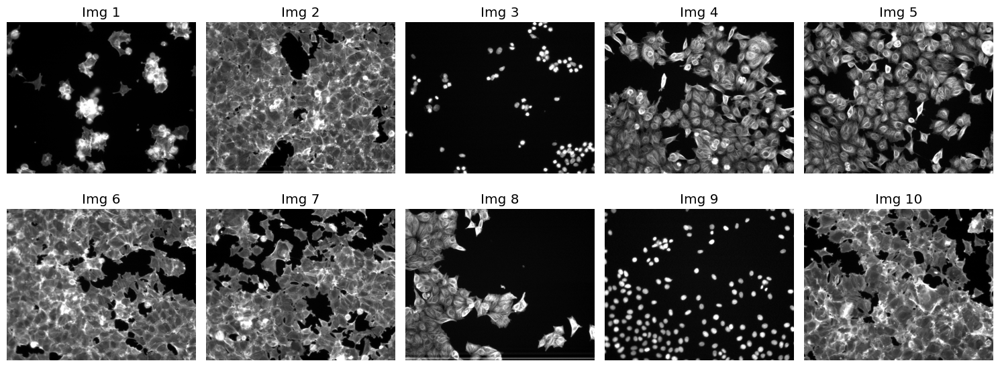

In [ ]:
visualizeImages(totalPath[:10])

### **1.3. Variable Types**
---

- Does the dataset have a target variable to estimate? If so, is it continuous or categorical?
- Analyze the label distribution and identify whether there is data imbalance.
- Does the dataset contain other additional variables? If so, analyze which ones will be incorporated into the model and perform a descriptive analysis of them.


**dfMoa** = information by treatment (unique)

It indicates the compound or type of medicine and the concentration whose effect is associated with the MOA (Mechanism of Action) reference.


dfImg = information by image. For the same experimental condition, there are several images, meaning many images per treatment.

Images of the cell under the effect of a medicine (compound), which produces a biological effect (MOA).

### **1.4. Relationship Between Variables**
---

- Analyze whether there is any relationship between the variables. Correlation measures or visualizations may be used.
- Identify whether there is redundancy among the variables for subsequent removal or selection.

The compound and concentration generate phenotypes, some of which can be classified under an MOA. However, not all phenotype changes produced by the compound and concentration are known.
In principle, the following relationship applies:


<center>(compound, concentration) -> MOA</center>
<center>or it could also be stated as</center>

<center>compound + concentration → cellular image</center>

It is important to note that phenotypes can be affected by environmental experimental factors, such as light intensity and other experimental conditions. For this reason, the data are separated by plates and weeks. In addition, the effect of the compound is progressive; cells go through different states (cell cycle, stress, disaggregation).
Phenotypes for the same treatment may differ across weeks, so there is a certain amount of noise inherent to the experiment. This is known as the batch effect.

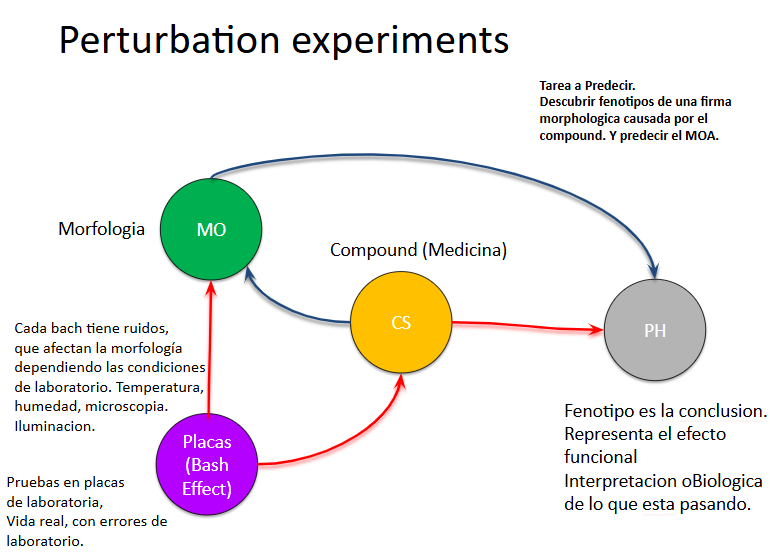

### **1.5. Cleaning and Normalization**
---


BBBC021 provides three independent images (biological channels) for each experiment, which can be separated as follows.


| Channel           | What it shows                        | What is observed                                  | Biological interpretation                                  |
| --------------- | ---------------------------------- | ----------------------------------------------- | --------------------------------------------------------- |
| Blue - DNA (nucleus) | Genetic material in the nucleus     | Size, shape, fragmentation, number of nuclei | Apoptosis, cellular stress, cell-cycle alterations |
| Green - Actin       | Cytoskeleton (cellular structure) | Cell shape, internal organization, borders     | Structural damage, cell migration, toxicity            |
| Red - Tubulin     | Microtubules                       | Internal network, mitotic spindle, organization        | Cell division, drug effects, mitotic arrest    |
| RGB    | All three channels combined                   |The sum of the previous channels | Various; some have an MOA label, others do not    |


Normalization was performed to visualize the channels; the RGB option is the artificial sum of all channels.

In [ ]:
df = dfFinal


The Broad Institute BBBC021 data repository contains a total of 39,600 images, including 13,200 in TIFF format. They are delivered compressed in ZIP files of approximately 750 MB; the total size is 55.04 GB. The number of images with an MOA label is 3,416*3=10,248, with a size of 15 GB. Considering this, it is reasonable to use only certain specific weeks first and then scale the model. This also helps reduce the *batch effect* in modeling and keeps computation times reasonable.


In [ ]:
reportDf = countValidImagesByWeek(dfMerged, CHANNEL_DIC)

print(reportDf)

     week  Num_images
0   week1         516
1  week10         240
2   week2         360
3   week3         636
4   week5         324
5   week6         300
6   week7         340
7   week8         292
8   week9         408
9   TOTAL        3416


In [ ]:
# num_unique = df["Image_PathName_Actin"].nunique()
# print(num_unique)
# df_counts = df["Image_PathName_Actin"].value_counts().reset_index()
# df_counts.columns = ["Image_PathName_Actin", "count"]

# display(df_counts)

compound: cytochalasin b
moa: Actin disruptors
concentration: 10.0
--------------------------------------------------


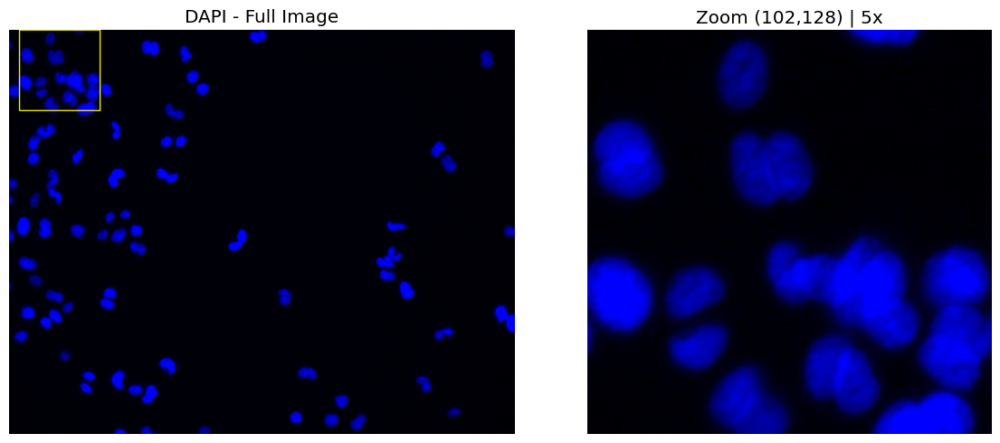

compound: cytochalasin b
moa: Actin disruptors
concentration: 10.0
--------------------------------------------------


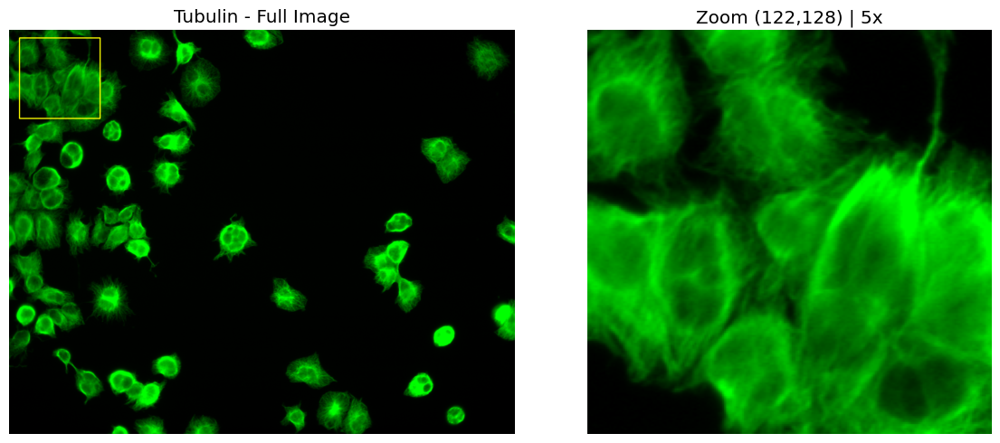

compound: cytochalasin b
moa: Actin disruptors
concentration: 10.0
--------------------------------------------------


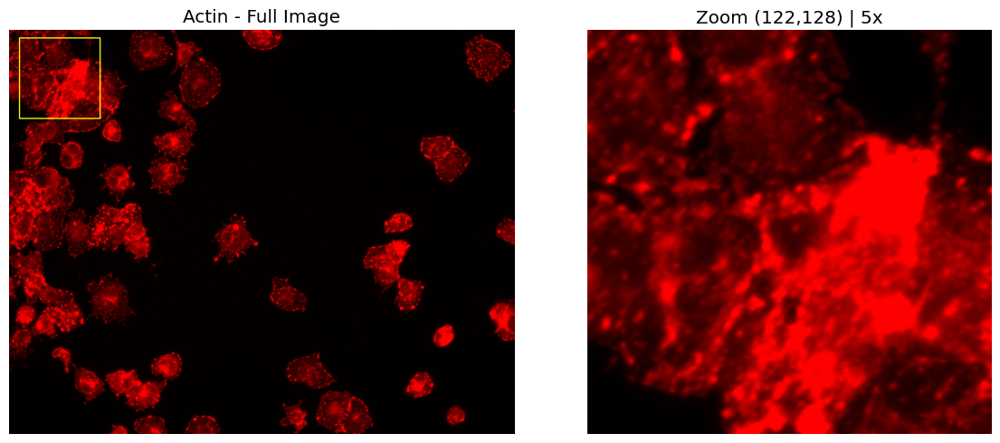

compound: cytochalasin b
moa: Actin disruptors
concentration: 10.0
--------------------------------------------------


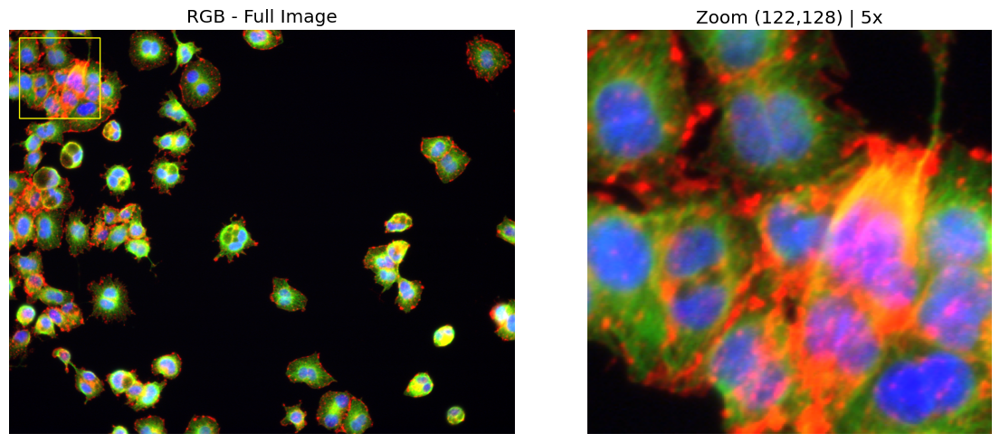

In [ ]:
plotZoomDualFromIndex(df, 2, imageDict, "DAPI", center=(0.10, 0.1), zoomX=5)
plotZoomDualFromIndex(df, 2, imageDict, "Tubulin", center=(0.12, 0.1), zoomX=5)
plotZoomDualFromIndex(df, 2, imageDict, "Actin", center=(0.12, 0.1), zoomX=5)
plotZoomDualFromIndex(df, 2, imageDict, "RGB", center=(0.12, 0.1), zoomX=5)

# **Experimental Design and Implementation**
---
---

## **1. Dataset Partitioning**
---



The image dataset does not have a predefined train/test partition. For this purpose, the images were stacked into a tensor with Height, Width, and channels. Each image channel [DAPI, Tubulin, Actin], each of size (224,224), is stacked as (Height, Width, Channel), producing a tensor T(224, 224, 3), which was applied to the dataset.

In [ ]:
def createImageTensorInput(dfFinal, imgDict, channels=["DAPI", "Tubulin", "Actin"], targetSize=(224, 224)):

    X, y, validIndices, invalidIndices = [], [], [], []

    for idx, row in dfFinal.iterrows():

        imgs = preprocessRow(row, imgDict, channels, targetSize)

        if imgs is None:
            invalidIndices.append(idx)
            continue

        imgStack = buildChannelsImageTensorHWC(imgs)

        if imgStack is None:
            invalidIndices.append(idx)
            continue

        X.append(imgStack)
        y.append(row["moa"])
        validIndices.append(idx)

    X = np.array(X)
    y = np.array(y)

    print("Total filas:", len(dfFinal))
    print("Válidas:", len(validIndices))
    print("Inválidas:", len(invalidIndices))

    return X, y, validIndices, invalidIndices

def preprocessRow(dfRow, imgDict, channels=["DAPI", "Tubulin", "Actin"], targetSize=(224, 224)):
    channelImgs = []

    for ch in channels:

        colName = CHANNEL_DIC[ch]["col"]
        path = dfRow[colName]
        img = preprocessSingleChannel(imgDict, path, targetSize)

        if img is None:
            return None

        channelImgs.append(img)

    return channelImgs

def buildChannelsImageTensorHWC(imgList):
    if imgList is None:
        return None
    try:
        imgStack = np.stack(imgList, axis=-1)
    except:
        return None

    return imgStack


In [ ]:
start = time.perf_counter()

X,y, validIndices, invalidIndices = createImageTensorInput(
    dfFinal,
    imageDict,
    channels=["DAPI", "Tubulin", "Actin"],
    targetSize=(224, 224))

endTimeRunning(start)

Total filas: 3416
Válidas: 3416
Inválidas: 0
Tiempo de ejecución: 173.2498 segundos
Tiempo de ejecución: 2.8875 minutos


## Data split into training, test, and validation sets.


In [ ]:
XTrain, XTemp, yTrain, yTemp = train_test_split(X, y, test_size=0.3, stratify=y)
XVal, XTest, yVal, yTest = train_test_split(XTemp, yTemp, test_size=0.5, stratify=yTemp)

The image tensors by channel were split into training, test, and validation data using the `train_test_split` function from `sklearn.model_selection`. The data were divided into 70% training, 15% test, and 15% validation.

In [ ]:
reportProptertiesVector(X)
reportProptertiesVector(y)
print(f'{XTrain.shape[0]}% {XVal.shape[0]}% {XTest.shape[0]}% = {(sum([XTrain.shape[0],XVal.shape[0], XTest.shape[0] ]))}%')


Propiedades
type    : <class 'numpy.ndarray'>
shape   : (3416, 224, 224, 3)
dtype   : float64
nbytes  : 3923.06 Mb
--------------------------------------------------
Propiedades
type    : <class 'numpy.ndarray'>
shape   : (3416,)
dtype   : <U25
nbytes  : 0.33 Mb
--------------------------------------------------
2391% 512% 513% = 3416%


# Data Augmentation

The idea is to include data augmentation without affecting the cellular biological information. Therefore, the goal is not to alter cell morphology, but rather to simulate experimental variation. The following transformations were applied:

- Small rotations of 0.1, approximately 18 degrees.
- Brightness/intensity variation.
- Noise using Gaussian noise.
- Small zoom.

In [ ]:
def buildDataAugmentation(zoom=0.1, contrast=0.1, noiseStd=0.03, rotation=0.02): #0.02×360∘=7.2grados

    augLayers = []

    if zoom is not None:
        augLayers.append(layers.RandomZoom(zoom))

    if rotation is not None:
        augLayers.append(layers.RandomRotation(rotation))

    if contrast is not None:
        augLayers.append(layers.RandomContrast(contrast))

    if noiseStd is not None:
        augLayers.append(layers.GaussianNoise(noiseStd))

    dataAugmentation = tf.keras.Sequential(augLayers)

    return dataAugmentation

In [ ]:
dataAumentationLayers = buildDataAugmentation(zoom=0.1,contrast=0.5,noiseStd=0.15)
sample = XTrain[0:1]
augmented = dataAumentationLayers(sample, training=True)

origImg = sample[0]
augImg = augmented[0].numpy()


# Preprocessed image 224x224


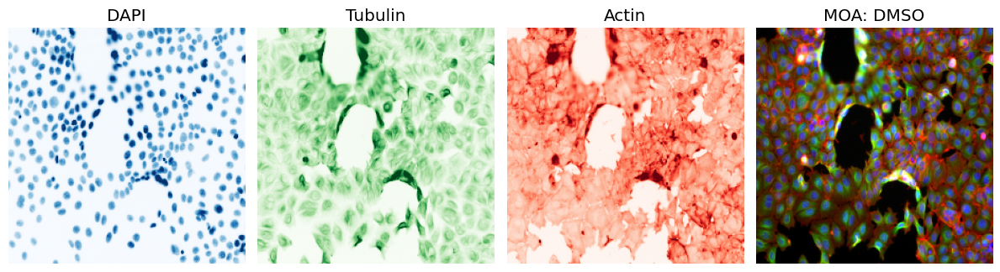

In [ ]:
cuartetoTensor(origImg, moa=yTrain[0]);

Image with data augmentation

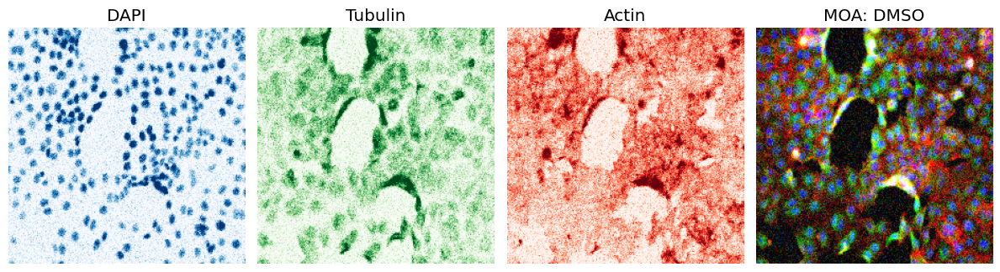

In [ ]:
cuartetoTensor(augImg, moa=yTrain[0]);

## Problem Definition:
---
Given an image of cells treated with a compound, predict its mechanism of action (MOA).

Because this is a supervised classification problem with labeled images, a CNN using convolutional neural networks will be implemented to estimate a categorical value (MOA) from the data.


In [ ]:
# Encoder
def labelEncoderClassWeights(yTrain, yVal, yTest):
  start = time.perf_counter()

  labelEncoder = LabelEncoder()

  yTrainEnc = labelEncoder.fit_transform(yTrain)
  yValEnc = labelEncoder.transform(yVal)
  yTestEnc = labelEncoder.transform(yTest)

  numClasses = len(labelEncoder.classes_)

  classes = np.unique(yTrainEnc)

  classWeights = compute_class_weight(
      class_weight="balanced",
      classes=classes,
      y=yTrainEnc
  )

  classWeights = np.sqrt(classWeights)
  classWeightDict = dict(zip(classes, classWeights))

  # display(classWeightDict)

  endTimeRunning(start)

  return {
        "yTrainEnc": yTrainEnc,
        "yValEnc": yValEnc,
        "yTestEnc": yTestEnc,
        "classWeights": classWeights,
        "classWeightDict": classWeightDict,
        "numClasses": numClasses,
        "labelEncoder": labelEncoder
    }

In [ ]:
encoderInitial  =labelEncoderClassWeights(yTrain, yVal, yTest)
yTrainEnc = encoderInitial["yTrainEnc"]
yValEnc = encoderInitial["yValEnc"]
yTestEnc = encoderInitial["yTestEnc"]
classWeights = encoderInitial["classWeights"]
classWeightDict = encoderInitial["classWeightDict"]
numClasses = encoderInitial["numClasses"]
labelEncoder = encoderInitial["labelEncoder"]


Tiempo de ejecución: 0.0041 segundos
Tiempo de ejecución: 0.0001 minutos


`LabelEncoder` from the `sklearn.preprocessing` library was used to convert categorical labels (MOA) into numeric values. The following classes were encoded:

In [ ]:
reportClasses(dfFinal, "moa", encoderInitial)

moa
Microtubule stabilizers      1284
DMSO                         1176
Microtubule destabilizers     168
Eg5 inhibitors                144
Aurora kinase inhibitors      108
DNA replication                96
Epithelial                     88
Protein degradation            84
Cholesterol-lowering           72
DNA damage                     60
Actin disruptors               60
Kinase inhibitors              40
Protein synthesis              36
Name: count, dtype: int64
----------------------------------------------------------------------------------------------------
numClasses : 13
----------------------------------------------------------------------------------------------------
len yTrainEnc   : 2391   (0.7)
len yValEnc     : 512     (0.15)
len yTestEnc    : 513    (0.15)
----------------------------------------------------------------------------------------------------
total encoder y : 3416


In [ ]:
# import sys
# sys.exit()

In [ ]:
print(yTrainEnc[:10])

[ 3 10  1 11  3  1  3 10 10  7]


In [ ]:
#Compile with History and Evaluation

def compileHistoryEvaluete(
    model,
    XTrain, yTrainEnc,
    XVal, yValEnc,
    epochs=10,
    batch_size=32,
    classWeights=None,
    earlyStop=None,
    # numClasses=numClasses,
    useExponentialDecay=False,
    learningRate=0.001,
    decaySteps=5000,
    decayRate=0.96,
    lossType="sparse",
    FLgamma=None,
    FLalpha=None):

    import tensorflow as tf
    start = time.perf_counter()

    # print("numClasses:", numClasses)
    print("learningRate:", learningRate)
    print("useExponentialDecay:", useExponentialDecay)
    print("lossType:", lossType)

    model.summary()

    def focal_loss(gamma=2., alpha=0.25):
        def loss(y_true, y_pred):
            ce = tf.keras.losses.categorical_crossentropy(y_true, y_pred)
            pt = tf.exp(-ce)
            return alpha * (1 - pt)**gamma * ce
        return loss

    if lossType == "sparse":
        lossModel = "sparse_categorical_crossentropy"

    elif lossType == "one-hot-vectors":
        lossModel = "categorical_crossentropy"

    elif lossType == "focal-loss":
        gamma = FLgamma if FLgamma is not None else 2.0
        alpha = FLalpha if FLalpha is not None else 0.25
        lossModel = focal_loss(gamma=gamma, alpha=alpha)

    else:
        raise ValueError("Invalid lossType")

    if useExponentialDecay:
        lrSchedule = ExponentialDecay(
            initial_learning_rate=learningRate,
            decay_steps=decaySteps,
            decay_rate=decayRate,
            staircase=False
        )
        optimizer = Adam(learning_rate=lrSchedule)
    else:
        optimizer = Adam(learning_rate=learningRate)

    model.compile(
        optimizer=optimizer,
        loss=lossModel,
        metrics=['accuracy']
    )



    callbacksList = []
    if earlyStop is not None:
        callbacksList.append(earlyStop)

    history = model.fit(
        XTrain, yTrainEnc,
        validation_data=(XVal, yValEnc),
        epochs=epochs,
        batch_size=batch_size,
        class_weight=classWeights,
        callbacks=callbacksList
    )

    model.evaluate(XTest, yTestEnc)

    endTimeRunning(start)

    return history



In [ ]:
def predictSample(
    model,
    labelEncoder,
    predictFrom="tensor",
    X=None,
    df=None,
    rowIndex=None,
    imageDict=None,
    targetSize=(224, 224),
    showProb=False,
    showCuarteto=False,
    yEncoded=None
):

    if predictFrom == "tensor":
        if X is None or rowIndex is None:
            raise ValueError("Para predictFrom='tensor' necesitas X y rowIndex")

        image = X[rowIndex]

        realLabel = None
        if yEncoded is not None:
            realLabel = labelEncoder.inverse_transform([yEncoded[rowIndex]])[0]

        if showCuarteto:
            cuartetoTensor(image, moa=realLabel)

    elif predictFrom == "raw":
        if df is None or rowIndex is None or imageDict is None:
            raise ValueError("Para predictFrom='raw' necesitas df, rowIndex e imageDict")

        row = df.iloc[rowIndex]

        imageModel, rgbOriginal, dapi, tubulin, actin = buildImageFromRow(
            row, imageDict, targetSize
        )

        image = imageModel

        realLabel = row["moa"]

        if showCuarteto:
            plotImages4Images3ChanelsCombine(
                dapi, tubulin, actin, rgbOriginal, realLabel
            )

    else:
        raise ValueError("predictFrom debe ser 'tensor' o 'raw'")

    inputTensor = np.expand_dims(image, axis=0)

    predictions = model.predict(inputTensor, verbose=0)
    predictedClassIndex = np.argmax(predictions, axis=1)[0]

    predictedLabel = labelEncoder.inverse_transform([predictedClassIndex])[0]


    print(f"Index: {rowIndex}")

    if 'realLabel' in locals() and realLabel is not None:
        print(f"Clase real: {realLabel}")

    print(f"Clase predicha: {predictedLabel}")

    if showProb:
        print(f"Probabilidades: {predictions}")

    return predictedLabel, predictions

In [ ]:
#Plot training history and Evaluation
def plotTrainingHistory(history):
    acc = history.history.get("accuracy", None)
    val_acc = history.history.get("val_accuracy", None)

    loss = history.history.get("loss", None)
    val_loss = history.history.get("val_loss", None)

    if acc is None or loss is None:
        print("No se encontraron métricas de accuracy o loss en history")
        return

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    axs[0].plot(acc, label="train_accuracy")
    if val_acc is not None:
        axs[0].plot(val_acc, label="val_accuracy")

    axs[0].set_title("Accuracy")
    axs[0].set_xlabel("Epochs")
    axs[0].set_ylabel("Accuracy")
    axs[0].legend()

    axs[1].plot(loss, label="train_loss")
    if val_loss is not None:
        axs[1].plot(val_loss, label="val_loss")

    axs[1].set_title("Loss")
    axs[1].set_xlabel("Epochs")
    axs[1].set_ylabel("Loss")
    axs[1].legend()

    plt.tight_layout()
    plt.show()


def evaluateModelF1ScoreAccuracy(model, XTest, yTest, labelEncoder):

    yPred = model.predict(XTest)
    yPredClasses = yPred.argmax(axis=1)

    if len(yTest.shape) > 1:      # Detectar si yTest es one-hot o sparse
        yTrueClasses = yTest.argmax(axis=1)
    else:
        yTrueClasses = yTest

    acc = accuracy_score(yTrueClasses, yPredClasses)
    f1 = f1_score(yTrueClasses, yPredClasses, average='macro')

    print("Accuracy:", acc)
    print("F1 Score (macro):", f1)

    print(classification_report(
        yTrueClasses,
        yPredClasses,
        target_names=labelEncoder.classes_
    ))

    return {
        "accuracy": acc,
        "f1": f1
    }



# **Model Training and Validation**
---


Different models were used and progressively refined according to the results obtained.

To optimize computation time, the models were first run using only experiments from 4 weeks, and then from 10 weeks. Implementation notes and observations were recorded for each model in order to refine it.

## Model_0:
---


A sequential model will be used with the following characteristics:
- An input layer for a 224x224 tensor with 3 channels.
- Data augmentation layers including RandomZoom, RandomRotation, RandomContrast, and Gaussian noise.
- A rescaling layer.
- Intermediate 2D convolutional layers to extract spatial patterns of cellular morphology.
- MaxPooling2D to reduce noise and dimensionality.
- A Flatten layer to reduce the output to vectors.
- Dense output layers with the number of classes and a softmax activation function.

In [ ]:
dataAug = buildDataAugmentation(zoom=0.3, contrast=0.1, noiseStd=0.03 ,rotation=0.02)  #0.02×360∘=7.2grados

model_0 = models.Sequential([

    layers.Input(shape=(224, 224, 3)),

    *dataAug.layers,  #Data Aumentation Layers

    layers.Rescaling(1./255),

    layers.Conv2D(32, (3,3), activation='relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D(),

    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(numClasses, activation='softmax')
])

In [ ]:
# model_0.summary()

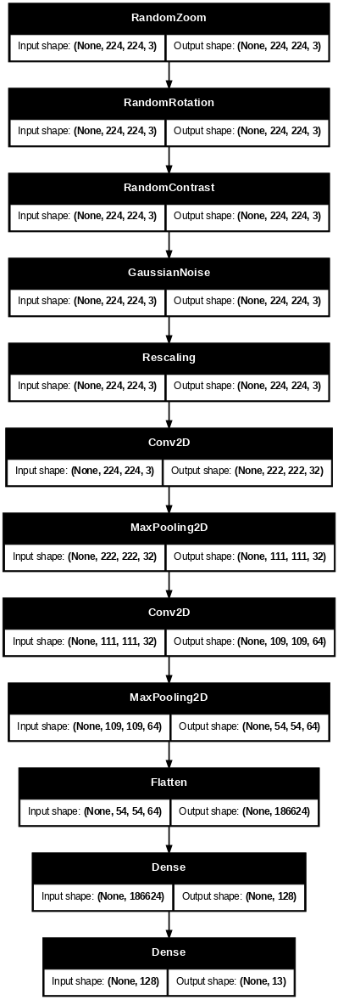

In [ ]:
plot_model(model_0 , to_file ='modelo.png',show_shapes=True,dpi=60 )  #dpi mas bajo imagen mas pequena

In [ ]:
history_0 = compileHistoryEvaluete(model_0, XTrain, yTrainEnc, XVal, yValEnc, epochs=10, batch_size=32, lossType="sparse")

learningRate: 0.001
useExponentialDecay: False
lossType: sparse


Model: "sequential_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_zoom_34 (RandomZoom)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_34              │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast_10              │ (None, 224, 224, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gaussian_noise_34               │ (None, 224, 224, 3)    │             0 │
│ (GaussianNoise)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_132 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_36 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_133 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_37 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 186624)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 128)            │    23,888,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,909,069 (91.21 MB)

 Trainable params: 23,909,069 (91.21 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.5320 - loss: 1.6309 - val_accuracy: 0.6777 - val_loss: 1.3090
Epoch 2/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step - accuracy: 0.6570 - loss: 1.3349 - val_accuracy: 0.6758 - val_loss: 1.2439
Epoch 3/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step - accuracy: 0.6646 - loss: 1.2709 - val_accuracy: 0.6836 - val_loss: 1.2096
Epoch 4/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step - accuracy: 0.6637 - loss: 1.2572 - val_accuracy: 0.6758 - val_loss: 1.2505
Epoch 5/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step - accuracy: 0.6629 - loss: 1.2377 - val_accuracy: 0.6777 - val_loss: 1.2065
Epoch 6/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step - accuracy: 0.6587 - loss: 1.2505 - val_accuracy: 0.6777 - val_loss: 1.1950
Epoch 7/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step - accuracy: 0.6708 - loss: 1.1851 - val_accuracy: 0.6777 - val_loss: 1.2044
Epoch 8/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step - accuracy: 0.6692 - loss: 1.1760 - val_accuracy: 0.6816 - v

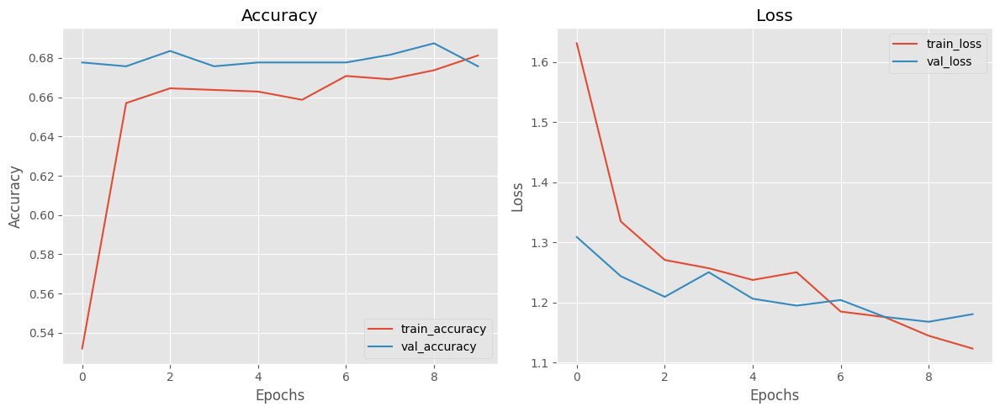

In [ ]:
plotTrainingHistory(history_0)


In [ ]:
evaluateModelF1ScoreAccuracy(model_0, XTest, yTestEnc, labelEncoder);

17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Accuracy: 0.6744639376218323
F1 Score (macro): 0.12140424311231603
                           precision    recall  f1-score   support

         Actin disruptors       0.00      0.00      0.00         9
 Aurora kinase inhibitors       0.00      0.00      0.00        16
     Cholesterol-lowering       0.00      0.00      0.00        11
                     DMSO       0.72      0.88      0.79       177
               DNA damage       0.00      0.00      0.00         9
          DNA replication       0.00      0.00      0.00        14
           Eg5 inhibitors       0.00      0.00      0.00        22
               Epithelial       0.00      0.00      0.00        13
        Kinase inhibitors       0.00      0.00      0.00         6
Microtubule destabilizers       0.00      0.00      0.00        26
  Microtubule stabilizers       0.66      0.98      0.79       193
      Protein degradation       0.00      0.00      0.00        12
        Protein synth

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


### Model_0 Implementation Notes and Results:
- Using 4 weeks: high accuracy of 0.6 and low F1-score of 0.16, which is a symptom of imbalanced classes. The model ignored 7 classes.
- Using 10 weeks: high accuracy of 0.67 and low F1-score of 0.13, which is a symptom of imbalanced classes. The model ignored 10 classes.


## Model2:
---
For comparison, a deeper model was also implemented. It includes data augmentation, 3 blocks, and a dropout of 0.3.

- Block 1 (32 filters) for edges and simple textures; biologically, this captures the cell membrane and nucleus contour.
- Block 2 (64 filters) for intermediate patterns, to observe cellular organization of organelles and cytoskeletal structure.
- Block 3 (128 filters) for complex structures with complex cellular patterns such as mitosis (dividing cells) and/or apoptosis (nuclear fragmentation), etc.

Finally, the extracted features are flattened and passed through a dense layer of 256 neurons with ReLU activation, followed by dropout (0.3) to reduce overfitting, and an output layer with softmax activation for classification.

In [ ]:
dataAug = buildDataAugmentation(zoom=0.3, contrast=0.1, noiseStd=0.03)

model2 = models.Sequential([

    layers.Input(shape=(224, 224, 3)),

    *dataAug.layers,


    layers.Conv2D(32, (3,3), padding='same'),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(64, (3,3), padding='same'),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(128, (3,3), padding='same'),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D(),

    layers.Flatten(),

    layers.Dense(256, activation='relu'),
    layers.Dropout(0.3),  #DropOUt :)

    layers.Dense(numClasses, activation='softmax')
])

In [ ]:
history2 = compileHistoryEvaluete(model2, XTrain, yTrainEnc, XVal, yValEnc, epochs=20, batch_size=32, lossType="sparse", classWeights=classWeightDict)


learningRate: 0.001
useExponentialDecay: False
lossType: sparse


Model: "sequential_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_zoom_35 (RandomZoom)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_35              │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast_11              │ (None, 224, 224, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gaussian_noise_35               │ (None, 224, 224, 3)    │             0 │
│ (GaussianNoise)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_134 (Conv2D)             │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_10 (Activation)      │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_38 (MaxPooling2D) │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_135 (Conv2D)             │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_11 (Activation)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_39 (MaxPooling2D) │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_136 (Conv2D)             │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_12 (Activation)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_40 (MaxPooling2D) │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 256)            │    25,690,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 13)             │         3,341 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25,787,853 (98.37 MB)

 Trainable params: 25,787,405 (98.37 MB)

 Non-trainable params: 448 (1.75 KB)

Epoch 1/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - accuracy: 0.2765 - loss: 15.7662 - val_accuracy: 0.3730 - val_loss: 2.8620
Epoch 2/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 10s 139ms/step - accuracy: 0.4049 - loss: 2.0157 - val_accuracy: 0.3750 - val_loss: 2.7368
Epoch 3/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 10s 138ms/step - accuracy: 0.4262 - loss: 2.0246 - val_accuracy: 0.3730 - val_loss: 3.3917
Epoch 4/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 10s 139ms/step - accuracy: 0.4814 - loss: 1.9807 - val_accuracy: 0.5137 - val_loss: 2.2567
Epoch 5/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 10s 136ms/step - accuracy: 0.3601 - loss: 2.0039 - val_accuracy: 0.3438 - val_loss: 2.3758
Epoch 6/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 10s 136ms/step - accuracy: 0.3442 - loss: 1.9946 - val_accuracy: 0.3438 - val_loss: 2.3338
Epoch 7/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 10s 136ms/step - accuracy: 0.3442 - loss: 1.9815 - val_accuracy: 0.3438 - val_loss: 2.2963
Epoch 8/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 10s 135ms/step - accuracy: 0.3559 - loss: 1.9701 - val_acc

In [ ]:
evaluateModelF1ScoreAccuracy(model2, XTest, yTestEnc, labelEncoder);

17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step
Accuracy: 0.3762183235867446
F1 Score (macro): 0.042057093048594466
                           precision    recall  f1-score   support

         Actin disruptors       0.00      0.00      0.00         9
 Aurora kinase inhibitors       0.00      0.00      0.00        16
     Cholesterol-lowering       0.00      0.00      0.00        11
                     DMSO       0.00      0.00      0.00       177
               DNA damage       0.00      0.00      0.00         9
          DNA replication       0.00      0.00      0.00        14
           Eg5 inhibitors       0.00      0.00      0.00        22
               Epithelial       0.00      0.00      0.00        13
        Kinase inhibitors       0.00      0.00      0.00         6
Microtubule destabilizers       0.00      0.00      0.00        26
  Microtubule stabilizers       0.38      1.00      0.55       193
      Protein degradation       0.00      0.00      0.00        12
        Protein synt

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


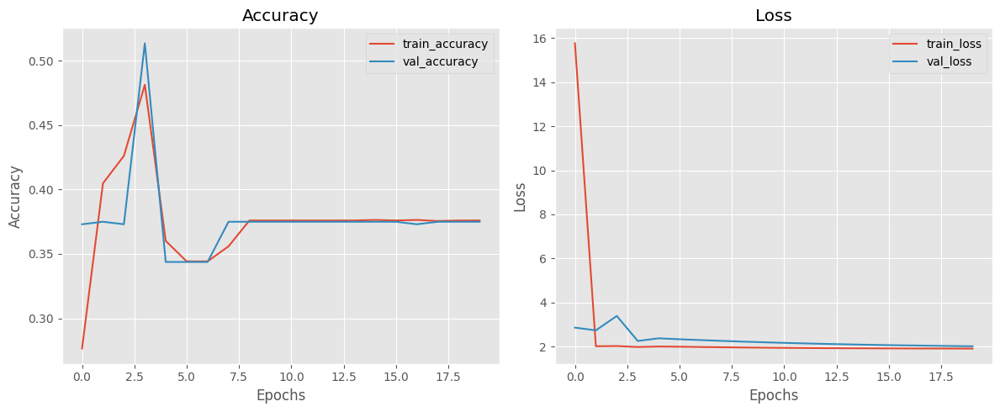

In [ ]:
plotTrainingHistory(history2)

### Model2 Implementation Notes and Results:

- Using 4 weeks, 20 epochs: medium accuracy of 0.28, F1-score=0.04. It ignores 9 classes.

- Result using 10 weeks, 20 epochs: medium accuracy of 0.5 but still deficient, F1-score of 0.11; it ignored 12 classes.
Possible improvement: include class weights (**classweights**) to provide balance.

## Model1BA:
---


Model1BA is a variation of Model1 in which the following were included:

- class weights to balance classes that are less frequent in the data.


- Additionally, data augmentation with the following values:

      zoom=0.3, contrast=0.05, noiseStd=0.03

In [ ]:
# print(XTrain.min(), XTrain.max())

In [ ]:
dataAug = buildDataAugmentation(zoom=0.3, contrast=0.05, noiseStd=0.03)
# dataAug = buildDataAugmentation(zoom=None, contrast=None, noiseStd=None, rotation=None)

model1BA = models.Sequential([
 	layers.Input(shape=(224, 224, 3)),

  *dataAug.layers,

	layers.Conv2D(filters = 32, kernel_size = (3,3), strides=(1,1), padding='valid' , activation='relu'),
	layers.MaxPooling2D(),
  layers.Conv2D(64, (3,3), strides=(1,1), padding='valid' , activation='relu'),
  layers.MaxPooling2D(),
  layers.GlobalAveragePooling2D(),
  layers.Dense(128, activation='relu'),
  layers.Dense(numClasses, activation='softmax') ])

In [ ]:
history1BA = compileHistoryEvaluete(model1BA, XTrain, yTrainEnc, XVal, yValEnc, epochs=20, batch_size=32, lossType="sparse", classWeights=classWeightDict)

learningRate: 0.001
useExponentialDecay: False
lossType: sparse


Model: "sequential_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_zoom_36 (RandomZoom)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_36              │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast_12              │ (None, 224, 224, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gaussian_noise_36               │ (None, 224, 224, 3)    │             0 │
│ (GaussianNoise)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_137 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_41 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_138 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_42 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_30     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_70 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step - accuracy: 0.5278 - loss: 1.8624 - val_accuracy: 0.6777 - val_loss: 1.4616
Epoch 2/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.6633 - loss: 1.5638 - val_accuracy: 0.6758 - val_loss: 1.4592
Epoch 3/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.6637 - loss: 1.5033 - val_accuracy: 0.6836 - val_loss: 1.3240
Epoch 4/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.6416 - loss: 1.4766 - val_accuracy: 0.6934 - val_loss: 1.3544
Epoch 5/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.6637 - loss: 1.4505 - val_accuracy: 0.6719 - val_loss: 1.4115
Epoch 6/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.6679 - loss: 1.4215 - val_accuracy: 0.6855 - val_loss: 1.4223
Epoch 7/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.6683 - loss: 1.3804 - val_accuracy: 0.6582 - val_loss: 1.3572
Epoch 8/20
75/75 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.6700 - loss: 1.3374 - val_accuracy: 0.6504 - v

In [ ]:
evaluateModelF1ScoreAccuracy(model1BA, XTest, yTestEnc, labelEncoder);

17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Accuracy: 0.682261208576998
F1 Score (macro): 0.35547912682755894
                           precision    recall  f1-score   support

         Actin disruptors       0.00      0.00      0.00         9
 Aurora kinase inhibitors       0.50      0.75      0.60        16
     Cholesterol-lowering       0.17      0.18      0.17        11
                     DMSO       0.78      0.84      0.81       177
               DNA damage       0.45      0.56      0.50         9
          DNA replication       0.16      0.36      0.22        14
           Eg5 inhibitors       0.37      0.32      0.34        22
               Epithelial       0.23      0.54      0.32        13
        Kinase inhibitors       0.17      0.17      0.17         6
Microtubule destabilizers       0.38      0.42      0.40        26
  Microtubule stabilizers       0.97      0.78      0.87       193
      Protein degradation       0.00      0.00      0.00        12
        Protein synthe

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


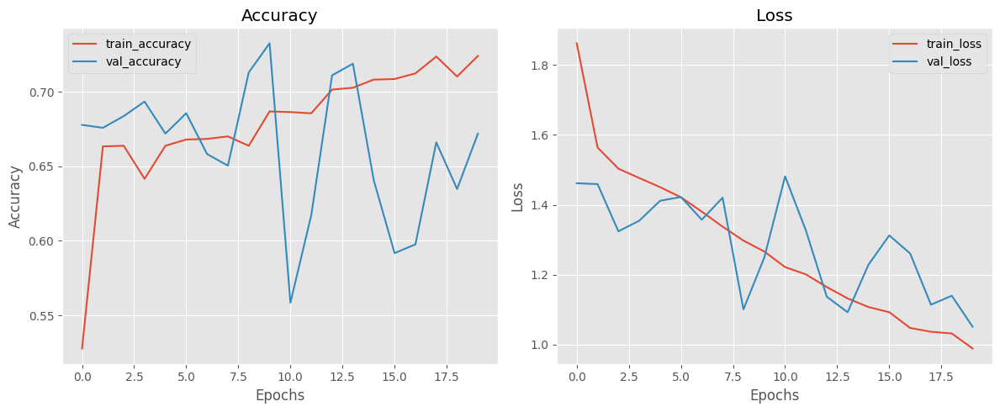

In [ ]:
plotTrainingHistory(history1BA)

### Model1BA Implementation Notes and Results:



Using 10 weeks: with data augmentation using the zoom, noise, and contrast values, indicators such as the F1-score decrease and the model ignores 3 classes.
Possible improvement: perform a sensitivity analysis to verify the relevance of data augmentation, and remove data augmentation to observe its effects.

---
## Model1B:

This is a variation of Model1B in which class weights were retained to balance classes that are less frequent in the data. Data augmentation was not included in order to verify its effects.

Additionally, the batch size was reduced from 32 to 8. With a smaller batch size, training is slower.


In [ ]:
model1B = models.Sequential([
 	layers.Input(shape=(224, 224, 3)),
	layers.Conv2D(filters = 32, kernel_size = (3,3), strides=(1,1), padding='valid' , activation='relu'),
	layers.MaxPooling2D(),
  layers.Conv2D(64, (3,3), strides=(1,1), padding='valid' , activation='relu'),
  layers.MaxPooling2D(),
  layers.GlobalAveragePooling2D(),
  layers.Dense(128, activation='relu'),
  layers.Dense(numClasses, activation='softmax') ])

In [ ]:
history1B = compileHistoryEvaluete(model1B, XTrain, yTrainEnc, XVal, yValEnc, epochs=20, batch_size=8, lossType="sparse", classWeights=classWeightDict)


learningRate: 0.001
useExponentialDecay: False
lossType: sparse


Model: "sequential_73"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_139 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_43 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_140 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_44 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_31     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.6223 - loss: 1.7269 - val_accuracy: 0.6758 - val_loss: 1.5099
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6604 - loss: 1.5057 - val_accuracy: 0.6914 - val_loss: 1.3869
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6696 - loss: 1.4331 - val_accuracy: 0.6934 - val_loss: 1.2143
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6688 - loss: 1.3665 - val_accuracy: 0.7266 - val_loss: 1.1919
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6888 - loss: 1.2915 - val_accuracy: 0.7305 - val_loss: 0.9928
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7164 - loss: 1.1531 - val_accuracy: 0.7324 - val_loss: 0.9087
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7131 - loss: 1.0791 - val_accuracy: 0.7500 - val_loss: 0.8808
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7386 - loss: 0.9973 - val_acc

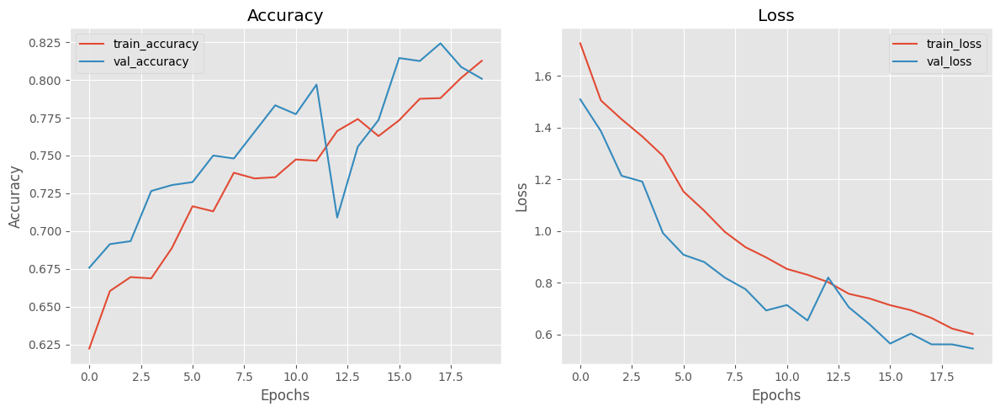

In [ ]:
plotTrainingHistory(history1B)

In [ ]:
evaluateModelF1ScoreAccuracy(model1B, XTest, yTestEnc, labelEncoder);

17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step
Accuracy: 0.8031189083820662
F1 Score (macro): 0.6271910242761554
                           precision    recall  f1-score   support

         Actin disruptors       0.75      0.33      0.46         9
 Aurora kinase inhibitors       0.94      0.94      0.94        16
     Cholesterol-lowering       0.67      0.18      0.29        11
                     DMSO       0.92      0.75      0.82       177
               DNA damage       0.62      0.89      0.73         9
          DNA replication       0.38      1.00      0.55        14
           Eg5 inhibitors       0.77      0.77      0.77        22
               Epithelial       0.42      1.00      0.59        13
        Kinase inhibitors       0.18      0.33      0.24         6
Microtubule destabilizers       0.88      0.58      0.70        26
  Microtubule stabilizers       0.94      0.93      0.94       193
      Protein degradation       0.39      0.58      0.47        12
        Protein synthe

### Model1B Implementation Notes and Results:

- Using 4 weeks, 20 epochs: high accuracy of 0.67 and high F1-score of 0.49. Reducing `batch_size` to 8 results in no ignored classes :)
- Using 10 weeks, 20 epochs: accuracy of 0.8 and high F1-score of 0.62. It does not ignore classes :) A `batch_size` of 8 produces good results.

Possible improvement: perform a sensitivity analysis to determine which data augmentation parameters are most relevant for this type of biological image.

In [ ]:
# display(classWeightDict)

#Sensitivity Analysis
---
---

## Sensitivity analysis of data augmentation hyperparameters:


A sensitivity analysis was performed to verify the effect of each data augmentation layer on the model under the following configurations:

In [ ]:
CONFIG_SENSIBILIDAD_DA = [
    {"name": "no_aug", "zoom": None, "rotation": None, "contrast": None, "noiseStd": None},
    {"name": "zoom", "zoom": 0.3, "rotation": None, "contrast": None, "noiseStd": None},
    {"name": "rotation", "zoom": None, "rotation": 0.02, "contrast": None, "noiseStd": None},
    {"name": "contrast", "zoom": None, "rotation": None, "contrast": 0.05, "noiseStd": None},
    {"name": "noise", "zoom": None, "rotation": None, "contrast": None, "noiseStd": 0.03},
    {"name": "full", "zoom": 0.3, "rotation": 0.02, "contrast": 0.05, "noiseStd": 0.03},
]

In [ ]:
def buildModel(dataAug, numClasses):

    model = models.Sequential([
        layers.Input(shape=(224, 224, 3)),

        *dataAug.layers,

        layers.Conv2D(filters = 32, kernel_size = (3,3), strides=(1,1), padding='valid' , activation='relu'),
        layers.MaxPooling2D(),
        layers.Conv2D(64, (3,3), strides=(1,1), padding='valid' , activation='relu'),
        layers.MaxPooling2D(),
        layers.GlobalAveragePooling2D(),
        layers.Dense(128, activation='relu'),
        layers.Dense(numClasses, activation='softmax') ])

    return model


In [ ]:
def contarClasesIgnoradas(yTrue, yPred, labelEncoder):

    report = classification_report(
        yTrue,
        yPred,
        target_names=labelEncoder.classes_,
        output_dict=True,
        zero_division=0
    )

    ignored = 0

    for clase in labelEncoder.classes_:
        metrics = report[clase]

        if (metrics["precision"] == 0.0 and
            metrics["recall"] == 0.0 and
            metrics["f1-score"] == 0.0):
            ignored += 1

    return ignored

In [ ]:
def loopSensibilidad(
    configSensibilidad,
    XTrain, yTrainEnc,
    XVal, yValEnc,
    XTest, yTestEnc,
    labelEncoder,
    numClasses,
    epochs,
    batch_size,
    classWeightDict=classWeightDict,
    earlyStop=None
):

    resultadosSensibilidad = []

    for cfg in configSensibilidad:

        print("\n==============================")
        print(f"Configuración: {cfg['name']}")
        print("="*50)

        dataAug = buildDataAugmentation(
            zoom=cfg["zoom"],
            rotation=cfg["rotation"],
            contrast=cfg["contrast"],
            noiseStd=cfg["noiseStd"]
        )

        model = buildModel(dataAug, numClasses)

        history = compileHistoryEvaluete(
            model,
            XTrain, yTrainEnc,
            XVal, yValEnc,
            epochs=epochs,
            batch_size=batch_size,
            lossType="sparse",
            classWeights=classWeightDict,
            earlyStop=earlyStop
        )


        # display(classWeightDict)

        metricsEval = evaluateModelF1ScoreAccuracy(
            model,
            XTest,
            yTestEnc,
            labelEncoder
        )

        yPred = model.predict(XTest)
        yPredClasses = yPred.argmax(axis=1)

        r2 = r2_score(yTestEnc, yPredClasses)

        numClasesIgnoradas = contarClasesIgnoradas(
            yTestEnc,
            yPredClasses,
            labelEncoder
        )

        resultadosSensibilidad.append({
            "config": cfg["name"],
            "accuracy": metricsEval["accuracy"],
            "f1": metricsEval["f1"],
            # "r2": r2,
            "ignoredClasses": numClasesIgnoradas
        })



    dfSensibilidad = pd.DataFrame(resultadosSensibilidad)
    dfSensibilidad = dfSensibilidad.sort_values(by="f1", ascending=False)

    return dfSensibilidad

In [ ]:
def plotMetricsSensibilidad(df):
    df = df.copy()

    df["metricName"] = df["config"].apply(lambda x: x.split("_")[0])
    df["value"] = df["config"].apply(lambda x: float(x.split("_")[1]))
    metricName = df["metricName"].iloc[0]

    df = df.sort_values(by="value")

    plt.figure()
    plt.plot(df["value"], df["accuracy"], marker='o', label="Accuracy")
    plt.plot(df["value"], df["f1"], marker='o', label="F1 Score")

    plt.title(f"{metricName.capitalize()} Sensitivity")
    plt.xlabel(metricName)
    plt.ylabel("Score")
    plt.legend()
    plt.grid(True)

    plt.show()

In [ ]:
numClasses = len(labelEncoder.classes_)

In [ ]:
# print(numClasses)

In [ ]:
dfSensibilidadDA = loopSensibilidad(
    configSensibilidad=CONFIG_SENSIBILIDAD_DA,
    XTrain=XTrain, yTrainEnc=yTrainEnc,
    XVal=XVal, yValEnc=yValEnc,
    XTest=XTest, yTestEnc=yTestEnc,
    labelEncoder=labelEncoder,
    numClasses=numClasses,
    epochs=20,
    batch_size=8,
    classWeightDict=classWeightDict,
    earlyStop=None
)


Configuración: no_aug
learningRate: 0.001
useExponentialDecay: False
lossType: sparse


Model: "sequential_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_141 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_45 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_142 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_46 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_32     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5914 - loss: 1.7362 - val_accuracy: 0.6816 - val_loss: 1.4432
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6545 - loss: 1.5095 - val_accuracy: 0.6914 - val_loss: 1.3159
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6616 - loss: 1.4480 - val_accuracy: 0.6895 - val_loss: 1.3511
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6550 - loss: 1.3936 - val_accuracy: 0.6973 - val_loss: 1.1577
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6775 - loss: 1.2954 - val_accuracy: 0.7500 - val_loss: 1.0808
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6884 - loss: 1.1940 - val_accuracy: 0.7109 - val_loss: 0.9532
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7235 - loss: 1.0576 - val_accuracy: 0.7441 - val_loss: 0.8497
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7235 - loss: 0.9863 - val_accu

Model: "sequential_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_zoom_37 (RandomZoom)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_143 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_47 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_144 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_48 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_33     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_77 (Dense)                │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 0.6018 - loss: 1.6838 - val_accuracy: 0.6797 - val_loss: 1.4078
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6558 - loss: 1.4770 - val_accuracy: 0.6855 - val_loss: 1.3037
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6679 - loss: 1.4214 - val_accuracy: 0.6973 - val_loss: 1.1372
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6788 - loss: 1.3504 - val_accuracy: 0.7207 - val_loss: 1.0967
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7018 - loss: 1.2279 - val_accuracy: 0.6719 - val_loss: 1.0481
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7143 - loss: 1.1235 - val_accuracy: 0.7578 - val_loss: 0.8682
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7194 - loss: 1.0617 - val_accuracy: 0.7188 - val_loss: 0.8657
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7148 - loss: 1.0187 - val_accu

Model: "sequential_79"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_rotation_37              │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_145 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_49 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_146 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_50 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_34     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 0.6215 - loss: 1.6874 - val_accuracy: 0.6777 - val_loss: 1.3454
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6675 - loss: 1.4776 - val_accuracy: 0.6836 - val_loss: 1.3945
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6654 - loss: 1.4145 - val_accuracy: 0.6484 - val_loss: 1.2699
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6734 - loss: 1.3724 - val_accuracy: 0.7305 - val_loss: 1.2170
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6821 - loss: 1.2982 - val_accuracy: 0.7266 - val_loss: 1.0914
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6993 - loss: 1.2130 - val_accuracy: 0.7129 - val_loss: 0.9799
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7139 - loss: 1.1040 - val_accuracy: 0.6211 - val_loss: 1.0623
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7344 - loss: 1.0162 - val_accu

Model: "sequential_81"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_contrast_13              │ (None, 224, 224, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_147 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_51 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_148 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_52 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_35     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.6198 - loss: 1.6934 - val_accuracy: 0.6797 - val_loss: 1.3221
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6579 - loss: 1.4838 - val_accuracy: 0.6836 - val_loss: 1.3055
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6780 - loss: 1.4130 - val_accuracy: 0.6914 - val_loss: 1.1929
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6821 - loss: 1.2932 - val_accuracy: 0.7246 - val_loss: 1.0985
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6867 - loss: 1.1780 - val_accuracy: 0.6797 - val_loss: 1.1577
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7177 - loss: 1.0903 - val_accuracy: 0.7012 - val_loss: 0.9239
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7248 - loss: 1.0222 - val_accuracy: 0.7051 - val_loss: 0.9830
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7286 - loss: 0.9777 - val_accu

Model: "sequential_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gaussian_noise_37               │ (None, 224, 224, 3)    │             0 │
│ (GaussianNoise)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_149 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_53 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_150 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_54 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_36     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.6449 - loss: 1.6887 - val_accuracy: 0.6621 - val_loss: 1.6182
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6688 - loss: 1.4728 - val_accuracy: 0.6621 - val_loss: 1.5286
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6763 - loss: 1.3892 - val_accuracy: 0.7070 - val_loss: 1.3080
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6738 - loss: 1.3136 - val_accuracy: 0.6875 - val_loss: 1.4584
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6809 - loss: 1.2211 - val_accuracy: 0.6953 - val_loss: 1.4032
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7148 - loss: 1.1093 - val_accuracy: 0.6250 - val_loss: 1.4125
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7160 - loss: 1.0369 - val_accuracy: 0.6211 - val_loss: 1.2299
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7399 - loss: 0.9723 - val_acc

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step

Configuración: full
learningRate: 0.001
useExponentialDecay: False
lossType: sparse


Model: "sequential_85"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_zoom_38 (RandomZoom)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_38              │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast_14              │ (None, 224, 224, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gaussian_noise_38               │ (None, 224, 224, 3)    │             0 │
│ (GaussianNoise)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_151 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_55 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_152 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_56 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_37     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_84 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - accuracy: 0.6278 - loss: 1.6869 - val_accuracy: 0.6660 - val_loss: 1.5966
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6583 - loss: 1.4841 - val_accuracy: 0.5898 - val_loss: 1.4693
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6600 - loss: 1.4121 - val_accuracy: 0.6699 - val_loss: 1.4383
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6734 - loss: 1.3500 - val_accuracy: 0.7188 - val_loss: 1.2402
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6930 - loss: 1.2492 - val_accuracy: 0.7422 - val_loss: 1.1718
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7156 - loss: 1.1269 - val_accuracy: 0.6172 - val_loss: 1.3391
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7081 - loss: 1.0704 - val_accuracy: 0.6719 - val_loss: 1.2091
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7143 - loss: 1.0180 - val_accu

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


## Implementation Notes and Observations for the Data Augmentation Sensitivity Analysis:

The results of the sensitivity analysis can be summarized in the following table:

In [ ]:
#Resultados analisis de sensibilidad con 10 Semanas.
display(dfSensibilidadDA)

,config,accuracy,f1,ignoredClasses
2,rotation,0.834308,0.639830,1
0,no_aug,0.830409,0.632269,0
3,contrast,0.783626,0.592079,0
1,zoom,0.730994,0.543049,0
5,full,0.654971,0.393458,3
4,noise,0.491228,0.297398,4



It can be observed that each layer has an effect on the model when compared with the configuration without data augmentation (`no_aug`):

Using 10 weeks:
- Rotation: F1-score values decrease and the model ignores 2 classes.
- Contrast: presents optimal accuracy values, but the F1-score values could be improved. It does not ignore classes.
- Noise: presents low F1-score values.
- The full configuration presents low F1-score values, perhaps due to the effect of configuration parameters such as the noise layer.
- Configuration without data augmentation (No_Aug): this configuration presents optimal accuracy values and medium F1-score values that could be improved.

Possible improvements:
Perform a more detailed sensitivity analysis for each component of the configuration.

Using 5 weeks:
- Rotation slightly increases accuracy and F1-score. It produces good output but ignores some classes.
- Zoom increases the metrics and produces good output; it does not ignore classes.
- Contrast should normally affect intensity but not the structure of the cell's biological information. Compared with the non-augmented model, there is little variation.
- Noise has a considerable effect because it causes the model to ignore one additional class and reduces metrics such as accuracy and F1-score.
- The full data augmentation configuration ignores one class and presents lower metrics compared with the rotation configuration.
- The noise-only configuration penalizes the model: the values decrease and it ignores 2 classes.


Possible improvements:
Perform a more detailed sensitivity analysis for each component of the configuration.

## Detailed Sensitivity Analysis to Gaussian Noise
---

To verify sensitivity to noise values, a sensitivity analysis was performed by gradually increasing the noise under the following configurations:

In [ ]:
CONFIG_SENSIBILIDAD_NOISE = [
    {"name": "noise_0.0",   "zoom": None, "rotation": None, "contrast": None, "noiseStd": 0.0},
    {"name": "noise_0.005", "zoom": None, "rotation": None, "contrast": None, "noiseStd": 0.005},
    {"name": "noise_0.01",  "zoom": None, "rotation": None, "contrast": None, "noiseStd": 0.01},
    {"name": "noise_0.02",  "zoom": None, "rotation": None, "contrast": None, "noiseStd": 0.02},
    {"name": "noise_0.03",  "zoom": None, "rotation": None, "contrast": None, "noiseStd": 0.03},
]

In [ ]:
dfSensibilidadNoise = loopSensibilidad(
    configSensibilidad=CONFIG_SENSIBILIDAD_NOISE,
    XTrain=XTrain, yTrainEnc=yTrainEnc,
    XVal=XVal, yValEnc=yValEnc,
    XTest=XTest, yTestEnc=yTestEnc,
    labelEncoder=labelEncoder,
    numClasses=numClasses,
    epochs=20,
    batch_size=8,
    classWeightDict=classWeightDict,
    earlyStop=None
)


Configuración: noise_0.0
learningRate: 0.001
useExponentialDecay: False
lossType: sparse


Model: "sequential_87"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gaussian_noise_39               │ (None, 224, 224, 3)    │             0 │
│ (GaussianNoise)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_153 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_57 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_154 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_58 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_38     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6090 - loss: 1.7198 - val_accuracy: 0.6758 - val_loss: 1.4070
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6612 - loss: 1.4925 - val_accuracy: 0.6895 - val_loss: 1.3457
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6621 - loss: 1.4396 - val_accuracy: 0.6934 - val_loss: 1.2749
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6612 - loss: 1.3687 - val_accuracy: 0.6973 - val_loss: 1.1271
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6750 - loss: 1.2868 - val_accuracy: 0.7109 - val_loss: 1.0023
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7072 - loss: 1.1870 - val_accuracy: 0.6914 - val_loss: 1.0225
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7135 - loss: 1.0928 - val_accuracy: 0.6582 - val_loss: 1.1133
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7327 - loss: 1.0142 - val_accu

Model: "sequential_89"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gaussian_noise_40               │ (None, 224, 224, 3)    │             0 │
│ (GaussianNoise)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_155 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_59 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_156 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_60 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_39     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5851 - loss: 1.7347 - val_accuracy: 0.6738 - val_loss: 1.4699
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6566 - loss: 1.5047 - val_accuracy: 0.6719 - val_loss: 1.2769
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6591 - loss: 1.3968 - val_accuracy: 0.5781 - val_loss: 1.3968
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6704 - loss: 1.3139 - val_accuracy: 0.7227 - val_loss: 1.0025
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7035 - loss: 1.2135 - val_accuracy: 0.7402 - val_loss: 0.9265
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7093 - loss: 1.1100 - val_accuracy: 0.7500 - val_loss: 0.8795
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7143 - loss: 1.0421 - val_accuracy: 0.7344 - val_loss: 0.8762
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7252 - loss: 0.9918 - val_acc

Model: "sequential_91"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gaussian_noise_41               │ (None, 224, 224, 3)    │             0 │
│ (GaussianNoise)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_157 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_61 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_158 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_62 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_40     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_91 (Dense)                │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.6136 - loss: 1.6862 - val_accuracy: 0.6758 - val_loss: 1.4423
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6646 - loss: 1.4909 - val_accuracy: 0.6914 - val_loss: 1.2776
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6608 - loss: 1.4054 - val_accuracy: 0.6777 - val_loss: 1.2716
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6683 - loss: 1.3465 - val_accuracy: 0.7129 - val_loss: 1.2026
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6826 - loss: 1.2380 - val_accuracy: 0.5449 - val_loss: 1.3911
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7064 - loss: 1.1278 - val_accuracy: 0.7168 - val_loss: 1.0105
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7252 - loss: 1.0309 - val_accuracy: 0.7793 - val_loss: 0.8443
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7390 - loss: 0.9516 - val_acc

Model: "sequential_93"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gaussian_noise_42               │ (None, 224, 224, 3)    │             0 │
│ (GaussianNoise)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_159 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_63 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_160 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_64 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_41     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5997 - loss: 1.6902 - val_accuracy: 0.6816 - val_loss: 1.4857
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6604 - loss: 1.4823 - val_accuracy: 0.6992 - val_loss: 1.2458
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6696 - loss: 1.4016 - val_accuracy: 0.7031 - val_loss: 1.2708
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6754 - loss: 1.3348 - val_accuracy: 0.6797 - val_loss: 1.2644
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6842 - loss: 1.2349 - val_accuracy: 0.6250 - val_loss: 1.1995
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7097 - loss: 1.1578 - val_accuracy: 0.7227 - val_loss: 1.0338
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7097 - loss: 1.0871 - val_accuracy: 0.7285 - val_loss: 0.9085
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7269 - loss: 1.0185 - val_acc

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step

Configuración: noise_0.03
learningRate: 0.001
useExponentialDecay: False
lossType: sparse


Model: "sequential_95"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gaussian_noise_43               │ (None, 224, 224, 3)    │             0 │
│ (GaussianNoise)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_161 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_65 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_162 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_66 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_42     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.6257 - loss: 1.6982 - val_accuracy: 0.6855 - val_loss: 1.4358
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6642 - loss: 1.5181 - val_accuracy: 0.6914 - val_loss: 1.4476
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6621 - loss: 1.4513 - val_accuracy: 0.6855 - val_loss: 1.3684
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6558 - loss: 1.3758 - val_accuracy: 0.6426 - val_loss: 1.3289
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6796 - loss: 1.2812 - val_accuracy: 0.7383 - val_loss: 1.2537
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7014 - loss: 1.1696 - val_accuracy: 0.6895 - val_loss: 1.3322
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7181 - loss: 1.0862 - val_accuracy: 0.5195 - val_loss: 1.4339
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7277 - loss: 1.0046 - val_acc

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


In [ ]:
dfSensibilidadNoise = dfSensibilidadNoise.sort_values(by= "config").reset_index(drop=True)
print(dfSensibilidadNoise)

        config  accuracy        f1  ignoredClasses
0    noise_0.0  0.857700  0.690674               1
1  noise_0.005  0.851852  0.641782               0
2   noise_0.01  0.713450  0.493695               1
3   noise_0.02  0.779727  0.513713               2
4   noise_0.03  0.697856  0.399897               3


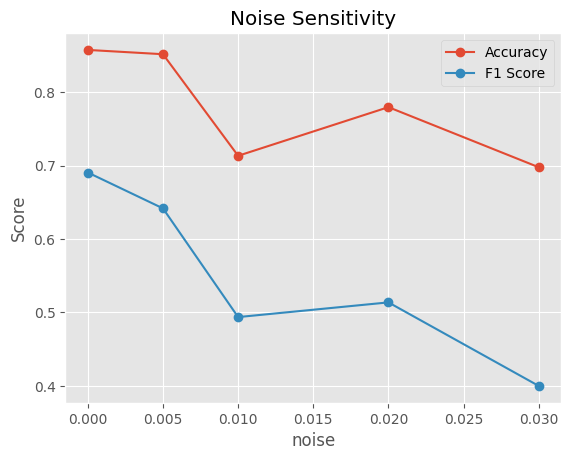

In [ ]:
plotMetricsSensibilidad(dfSensibilidadNoise)

## Implementation Notes and Observations for Gaussian Noise Sensitivity Analysis:

- With 5 weeks: noise sensitivity shows that, for values equal to or greater than 0.01, the metrics decrease and the model ignores two classes.
- With 10 weeks: there is a peak at 0.005. The model is very sensitive to values above 0.01; it is advisable to use low values that represent possible laboratory errors.

In [ ]:
print(dfSensibilidadNoise.columns)

Index(['config', 'accuracy', 'f1', 'ignoredClasses'], dtype='object')


## Zoom Sensitivity Analysis:
---

A sensitivity analysis of the zoom values was performed using the following configuration:

In [ ]:
CONFIG_SENSIBILIDAD_ZOOM = [
    {"name": "zoom_0.0",   "zoom": 0, "rotation": None, "contrast": None, "noiseStd":None },
    {"name": "zoom_0.1", "zoom": 0.1, "rotation": None, "contrast": None, "noiseStd":None },
    {"name": "zoom_0.2", "zoom": 0.2, "rotation": None, "contrast": None, "noiseStd":None },
    {"name": "zoom_0.3", "zoom": 0.3, "rotation": None, "contrast": None, "noiseStd":None },
    {"name": "zoom_0.4", "zoom": 0.4, "rotation": None, "contrast": None, "noiseStd":None },
    {"name": "zoom_0.5",  "zoom": 0.5, "rotation": None, "contrast": None, "noiseStd":None },
]

In [ ]:
dfSensibilidadZoom = loopSensibilidad(
    configSensibilidad=CONFIG_SENSIBILIDAD_ZOOM,
    XTrain=XTrain, yTrainEnc=yTrainEnc,
    XVal=XVal, yValEnc=yValEnc,
    XTest=XTest, yTestEnc=yTestEnc,
    labelEncoder=labelEncoder,
    numClasses=numClasses,
    epochs=20,
    batch_size=8,
    classWeightDict=classWeightDict,
    earlyStop=None
)


Configuración: zoom_0.0
learningRate: 0.001
useExponentialDecay: False
lossType: sparse


Model: "sequential_97"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_zoom_39 (RandomZoom)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_163 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_67 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_164 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_68 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_43     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_96 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 0.5793 - loss: 1.7324 - val_accuracy: 0.6836 - val_loss: 1.4482
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6629 - loss: 1.4855 - val_accuracy: 0.6855 - val_loss: 1.2829
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6754 - loss: 1.3875 - val_accuracy: 0.7129 - val_loss: 1.1230
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6905 - loss: 1.2591 - val_accuracy: 0.7148 - val_loss: 1.0149
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7072 - loss: 1.1628 - val_accuracy: 0.6699 - val_loss: 1.0383
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7143 - loss: 1.0790 - val_accuracy: 0.6914 - val_loss: 0.9660
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7198 - loss: 1.0222 - val_accuracy: 0.7461 - val_loss: 0.8911
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7327 - loss: 0.9854 - val_accu

Model: "sequential_99"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_zoom_40 (RandomZoom)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_165 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_69 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_166 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_70 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_44     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_98 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 0.6215 - loss: 1.6972 - val_accuracy: 0.6719 - val_loss: 1.4517
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6583 - loss: 1.5060 - val_accuracy: 0.6934 - val_loss: 1.2711
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6637 - loss: 1.4368 - val_accuracy: 0.6758 - val_loss: 1.3407
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6667 - loss: 1.3593 - val_accuracy: 0.6816 - val_loss: 1.1276
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6959 - loss: 1.2625 - val_accuracy: 0.7051 - val_loss: 1.0396
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7068 - loss: 1.1416 - val_accuracy: 0.7109 - val_loss: 1.0358
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7123 - loss: 1.0591 - val_accuracy: 0.7012 - val_loss: 0.8978
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7181 - loss: 1.0063 - val_accu

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step

Configuración: zoom_0.2
learningRate: 0.001
useExponentialDecay: False
lossType: sparse


Model: "sequential_101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_zoom_41 (RandomZoom)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_167 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_71 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_168 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_72 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_45     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_100 (Dense)               │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 0.6156 - loss: 1.7017 - val_accuracy: 0.6758 - val_loss: 1.4926
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6432 - loss: 1.5039 - val_accuracy: 0.6836 - val_loss: 1.2705
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6729 - loss: 1.4310 - val_accuracy: 0.6875 - val_loss: 1.3147
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6738 - loss: 1.3802 - val_accuracy: 0.6836 - val_loss: 1.1311
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6888 - loss: 1.2931 - val_accuracy: 0.6660 - val_loss: 1.1416
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6947 - loss: 1.2164 - val_accuracy: 0.7148 - val_loss: 1.0381
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7164 - loss: 1.1351 - val_accuracy: 0.6934 - val_loss: 1.1609
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7160 - loss: 1.0754 - val_accu

Model: "sequential_103"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_zoom_42 (RandomZoom)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_169 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_73 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_170 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_74 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_46     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 0.6094 - loss: 1.7011 - val_accuracy: 0.6777 - val_loss: 1.3854
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6587 - loss: 1.5122 - val_accuracy: 0.6875 - val_loss: 1.3678
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6717 - loss: 1.4405 - val_accuracy: 0.6094 - val_loss: 1.2701
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6742 - loss: 1.3588 - val_accuracy: 0.7188 - val_loss: 1.0901
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6884 - loss: 1.2679 - val_accuracy: 0.6484 - val_loss: 1.0844
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7077 - loss: 1.1715 - val_accuracy: 0.7246 - val_loss: 0.9822
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6905 - loss: 1.1156 - val_accuracy: 0.7305 - val_loss: 0.9238
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7231 - loss: 1.0364 - val_accu

Model: "sequential_105"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_zoom_43 (RandomZoom)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_171 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_75 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_172 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_76 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_47     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_104 (Dense)               │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_105 (Dense)               │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 0.5696 - loss: 1.7490 - val_accuracy: 0.6816 - val_loss: 1.3999
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6545 - loss: 1.5160 - val_accuracy: 0.6484 - val_loss: 1.3831
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6612 - loss: 1.4582 - val_accuracy: 0.6777 - val_loss: 1.2522
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6788 - loss: 1.3714 - val_accuracy: 0.7090 - val_loss: 1.1476
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6842 - loss: 1.2843 - val_accuracy: 0.6992 - val_loss: 0.9852
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7097 - loss: 1.1782 - val_accuracy: 0.7305 - val_loss: 0.9379
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7102 - loss: 1.0984 - val_accuracy: 0.7090 - val_loss: 0.8987
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7252 - loss: 1.0121 - val_accu

Model: "sequential_107"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_zoom_44 (RandomZoom)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_173 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_77 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_174 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_78 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_48     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 0.5717 - loss: 1.7423 - val_accuracy: 0.6758 - val_loss: 1.4219
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6554 - loss: 1.5090 - val_accuracy: 0.6895 - val_loss: 1.3527
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6566 - loss: 1.4399 - val_accuracy: 0.6934 - val_loss: 1.2162
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6629 - loss: 1.3674 - val_accuracy: 0.7188 - val_loss: 1.1728
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6775 - loss: 1.2902 - val_accuracy: 0.6445 - val_loss: 1.1777
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6943 - loss: 1.1801 - val_accuracy: 0.6875 - val_loss: 1.0271
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6985 - loss: 1.1140 - val_accuracy: 0.6523 - val_loss: 1.0114
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7148 - loss: 1.0669 - val_accu

In [ ]:

dfSensibilidadZoom=dfSensibilidadZoom.sort_values(by="config").reset_index(drop=True)
print(dfSensibilidadZoom)

     config  accuracy        f1  ignoredClasses
0  zoom_0.0  0.842105  0.637250               0
1  zoom_0.1  0.820663  0.582873               1
2  zoom_0.2  0.795322  0.572876               0
3  zoom_0.3  0.803119  0.569292               0
4  zoom_0.4  0.826511  0.625417               1
5  zoom_0.5  0.834308  0.594938               0


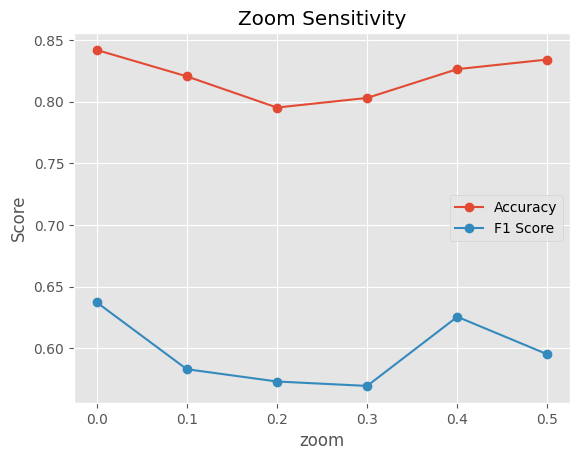

In [ ]:
plotMetricsSensibilidad(dfSensibilidadZoom)

## Implementation Notes and Observations for Zoom Sensitivity:

Using 10 weeks:
- There is normal variation where, in some cases, zoom may damage or prevent recognition of biological information. For example, it may lose nucleus characteristics while gaining cytoskeletal characteristics. The most optimal value is 0.3, which explains why multiple peaks are normal: while one class is favored by zoom, others are not.


## Contrast Sensitivity Analysis:
---

In [ ]:
CONFIG_SENSIBILIDAD_CONTRAST = [
    {"name": "contrast_0.0",  "zoom": None, "rotation": None, "contrast": 0.0,  "noiseStd": None},
    {"name": "contrast_0.05", "zoom": None, "rotation": None, "contrast": 0.05, "noiseStd": None},
    {"name": "contrast_0.1",  "zoom": None, "rotation": None, "contrast": 0.1,  "noiseStd": None},
    {"name": "contrast_0.2",  "zoom": None, "rotation": None, "contrast": 0.2,  "noiseStd": None},
    {"name": "contrast_0.3",  "zoom": None, "rotation": None, "contrast": 0.3,  "noiseStd": None},
]

In [ ]:
dfSensibilidadContrast = loopSensibilidad(
    configSensibilidad=CONFIG_SENSIBILIDAD_CONTRAST,
    XTrain=XTrain, yTrainEnc=yTrainEnc,
    XVal=XVal, yValEnc=yValEnc,
    XTest=XTest, yTestEnc=yTestEnc,
    labelEncoder=labelEncoder,
    numClasses=numClasses,
    epochs=20,
    batch_size=8,
    classWeightDict=classWeightDict,
    earlyStop=None
)


Configuración: contrast_0.0
learningRate: 0.001
useExponentialDecay: False
lossType: sparse


Model: "sequential_109"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_contrast_15              │ (None, 224, 224, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_175 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_79 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_176 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_80 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_49     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_108 (Dense)               │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - accuracy: 0.6115 - loss: 1.7065 - val_accuracy: 0.6660 - val_loss: 1.3909
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6650 - loss: 1.4980 - val_accuracy: 0.6855 - val_loss: 1.2966
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6679 - loss: 1.4128 - val_accuracy: 0.6855 - val_loss: 1.2128
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6859 - loss: 1.3315 - val_accuracy: 0.7109 - val_loss: 1.1005
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6934 - loss: 1.2269 - val_accuracy: 0.7012 - val_loss: 0.9847
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7093 - loss: 1.1486 - val_accuracy: 0.6621 - val_loss: 1.0128
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7231 - loss: 1.0686 - val_accuracy: 0.7617 - val_loss: 0.8389
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7281 - loss: 0.9960 - val_acc

Model: "sequential_111"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_contrast_16              │ (None, 224, 224, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_177 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_81 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_178 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_82 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_50     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5713 - loss: 1.7322 - val_accuracy: 0.6523 - val_loss: 1.4115
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6642 - loss: 1.5019 - val_accuracy: 0.6797 - val_loss: 1.2410
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6742 - loss: 1.3828 - val_accuracy: 0.7109 - val_loss: 1.1697
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6959 - loss: 1.2480 - val_accuracy: 0.6992 - val_loss: 1.0506
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7001 - loss: 1.1217 - val_accuracy: 0.7246 - val_loss: 1.0105
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7164 - loss: 1.0630 - val_accuracy: 0.6914 - val_loss: 1.0106
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7302 - loss: 0.9959 - val_accuracy: 0.6309 - val_loss: 0.9664
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7357 - loss: 0.9523 - val_acc

Model: "sequential_113"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_contrast_17              │ (None, 224, 224, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_179 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_83 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_180 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_84 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_51     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_112 (Dense)               │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5947 - loss: 1.7427 - val_accuracy: 0.6777 - val_loss: 1.4178
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6671 - loss: 1.4969 - val_accuracy: 0.6914 - val_loss: 1.3001
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6616 - loss: 1.4131 - val_accuracy: 0.6992 - val_loss: 1.2063
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6767 - loss: 1.3293 - val_accuracy: 0.7402 - val_loss: 1.0902
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6947 - loss: 1.2016 - val_accuracy: 0.7363 - val_loss: 0.8986
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7181 - loss: 1.0721 - val_accuracy: 0.7598 - val_loss: 0.9033
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7373 - loss: 0.9723 - val_accuracy: 0.7930 - val_loss: 0.8354
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7432 - loss: 0.9067 - val_acc

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step

Configuración: contrast_0.2
learningRate: 0.001
useExponentialDecay: False
lossType: sparse


Model: "sequential_115"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_contrast_18              │ (None, 224, 224, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_181 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_85 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_182 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_86 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_52     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.6060 - loss: 1.7150 - val_accuracy: 0.6777 - val_loss: 1.3331
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6583 - loss: 1.5039 - val_accuracy: 0.6660 - val_loss: 1.3442
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6579 - loss: 1.4300 - val_accuracy: 0.6973 - val_loss: 1.1777
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6713 - loss: 1.3406 - val_accuracy: 0.7129 - val_loss: 1.1811
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7035 - loss: 1.2183 - val_accuracy: 0.7109 - val_loss: 1.0061
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7143 - loss: 1.1269 - val_accuracy: 0.7012 - val_loss: 1.0213
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7131 - loss: 1.0378 - val_accuracy: 0.7246 - val_loss: 0.8632
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7294 - loss: 0.9708 - val_acc

Model: "sequential_117"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_contrast_19              │ (None, 224, 224, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_183 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_87 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_184 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_88 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_53     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_116 (Dense)               │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.6115 - loss: 1.7243 - val_accuracy: 0.6777 - val_loss: 1.4181
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6708 - loss: 1.5093 - val_accuracy: 0.6680 - val_loss: 1.3434
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6596 - loss: 1.4296 - val_accuracy: 0.6895 - val_loss: 1.2811
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6734 - loss: 1.3513 - val_accuracy: 0.7324 - val_loss: 1.2207
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6913 - loss: 1.2341 - val_accuracy: 0.7227 - val_loss: 1.2322
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6926 - loss: 1.1448 - val_accuracy: 0.6797 - val_loss: 1.1693
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7135 - loss: 1.0567 - val_accuracy: 0.6914 - val_loss: 0.9643
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7269 - loss: 1.0007 - val_acc

In [ ]:

dfSensibilidadContrast=dfSensibilidadContrast.sort_values(by="config").reset_index(drop=True)
print(dfSensibilidadContrast)

          config  accuracy        f1  ignoredClasses
0   contrast_0.0  0.830409  0.584528               0
1  contrast_0.05  0.803119  0.633198               0
2   contrast_0.1  0.812865  0.632392               1
3   contrast_0.2  0.799220  0.602787               0
4   contrast_0.3  0.797271  0.581762               0


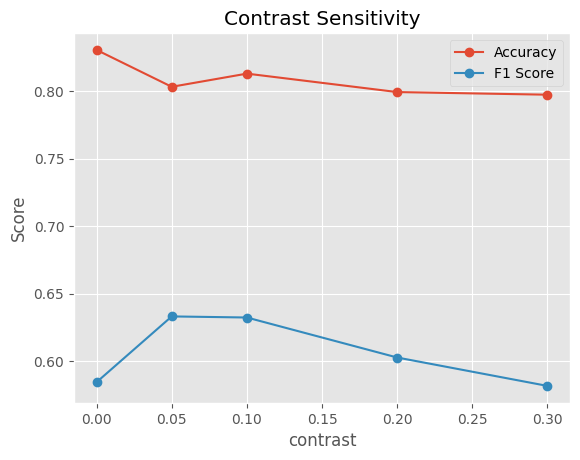

In [ ]:
plotMetricsSensibilidad(dfSensibilidadContrast)

## Implementation Notes and Observations:
- With very low values, some classes are lost, so including very low values does not benefit the model. Increasing contrast may be damaging the cell's biological signal for small elements such as the cytoskeleton. A deeper network could also be used, but it would require more computation.

# Optimized Model1BA with Data Augmentation:
---

After performing the sensitivity analysis on Model1BA, the data augmentation layers were adjusted to the following values:

In [ ]:
dataAug = buildDataAugmentation(zoom=0.3, contrast=None, noiseStd=0.005, rotation=0.02) #Bastante sensibilidad incluso 0.02 al contraste.

model1BAOptimizado = models.Sequential([
 	layers.Input(shape=(224, 224, 3)),

  *dataAug.layers,

	layers.Conv2D(filters = 32, kernel_size = (3,3), strides=(1,1), padding='valid' , activation='relu'),
	layers.MaxPooling2D(),
  layers.Conv2D(64, (3,3), strides=(1,1), padding='valid' , activation='relu'),
  layers.MaxPooling2D(),
  layers.GlobalAveragePooling2D(),
  layers.Dense(128, activation='relu'),
  layers.Dense(numClasses, activation='softmax') ])

In [ ]:
historyModel1BAOptimizado = compileHistoryEvaluete(model1BAOptimizado, XTrain, yTrainEnc, XVal, yValEnc, epochs=20, batch_size=8,
                                                   lossType="sparse", classWeights=classWeightDict,
                                                   useExponentialDecay=False)

learningRate: 0.001
useExponentialDecay: False
lossType: sparse


Model: "sequential_119"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_zoom_45 (RandomZoom)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_39              │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gaussian_noise_44               │ (None, 224, 224, 3)    │             0 │
│ (GaussianNoise)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_185 (Conv2D)             │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_89 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_186 (Conv2D)             │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_90 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_54     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_119 (Dense)               │ (None, 13)             │         1,677 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,389 (114.80 KB)

 Trainable params: 29,389 (114.80 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.6115 - loss: 1.6631 - val_accuracy: 0.6816 - val_loss: 1.3832
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.6688 - loss: 1.4309 - val_accuracy: 0.6875 - val_loss: 1.1791
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6763 - loss: 1.3560 - val_accuracy: 0.6973 - val_loss: 1.1802
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6713 - loss: 1.3115 - val_accuracy: 0.6953 - val_loss: 1.1265
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6884 - loss: 1.2242 - val_accuracy: 0.7266 - val_loss: 1.0534
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.7014 - loss: 1.1575 - val_accuracy: 0.7109 - val_loss: 1.0173
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.7215 - loss: 1.0629 - val_accuracy: 0.6953 - val_loss: 0.9493
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7219 - loss: 1.0115 - val_accu

In [ ]:
evaluateModelF1ScoreAccuracy(model1BAOptimizado, XTest, yTestEnc, labelEncoder);


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Accuracy: 0.7348927875243665
F1 Score (macro): 0.45489377674292303
                           precision    recall  f1-score   support

         Actin disruptors       0.50      0.11      0.18         9
 Aurora kinase inhibitors       1.00      0.62      0.77        16
     Cholesterol-lowering       0.16      0.27      0.20        11
                     DMSO       0.86      0.77      0.82       177
               DNA damage       0.42      0.89      0.57         9
          DNA replication       0.24      1.00      0.39        14
           Eg5 inhibitors       0.75      0.27      0.40        22
               Epithelial       0.44      0.85      0.58        13
        Kinase inhibitors       0.00      0.00      0.00         6
Microtubule destabilizers       0.54      0.54      0.54        26
  Microtubule stabilizers       0.97      0.88      0.92       193
      Protein degradation       0.00      0.00      0.00        12
        Protein synth

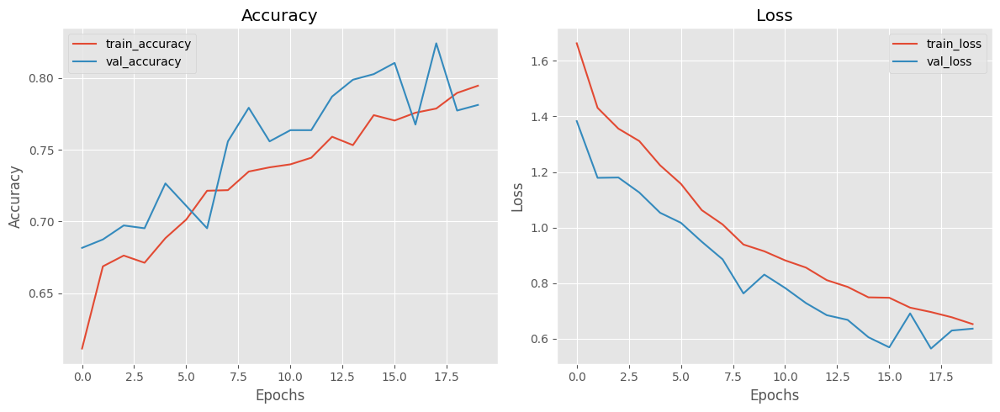

In [ ]:
plotTrainingHistory(historyModel1BAOptimizado)

### Optimized Model1BA Implementation Notes, Observations, and Results:

With 10 weeks:
- Accuracy is 0.7 and the F1-score is in a medium range at f1=0.45, which could be improved. Although the model ignores 3 classes, it is aligned with real experimental conditions such as actual biological variations (microscope, stain variations, preparation, etc.). However, data augmentation may be helping the majority classes while penalizing the minority classes.
- Although Model1B presents better Accuracy and F1-score metrics, it is less realistic for the reasons described above.


# Class Grouping

To reduce class imbalance, the classes were grouped as follows:

In [ ]:
classMapping = {
    "DMSO": "DMSO",

    "Microtubule stabilizers": "Microtubule stabilizers",
    "Microtubule destabilizers": "Microtubule destabilizers",

    "Eg5 inhibitors": "Mitosis inhibitors",
    "Aurora kinase inhibitors": "Mitosis inhibitors",
    "Kinase inhibitors": "Mitosis inhibitors",

    "DNA replication": "DNA processes",
    "DNA damage": "DNA processes",

    "Protein degradation": "Protein metabolism",
    "Protein synthesis": "Protein metabolism",

    "Epithelial": "Others",
    "Actin disruptors": "Others",
    "Cholesterol-lowering": "Others",

}

In [ ]:
dfFinal["moaGrouped"] = dfFinal["moa"].map(classMapping)

yTrainGrouped = np.array([classMapping[y] for y in yTrain])
yValGrouped   = np.array([classMapping[y] for y in yVal])
yTestGrouped  = np.array([classMapping[y] for y in yTest])

# yTrainGrouped = pd.Series(yTrain).map(classMapping)
# yValGrouped   = pd.Series(yVal).map(classMapping)
# yTestGrouped  = pd.Series(yTest).map(classMapping)

groupEncoder= labelEncoderClassWeights(yTrainGrouped, yValGrouped, yTestGrouped)

yTrainEncGrouped = groupEncoder["yTrainEnc"]
yValEncGrouped = groupEncoder["yValEnc"]
yTestEncGrouped = groupEncoder["yTestEnc"]
classWeightsGrouped = groupEncoder["classWeights"]
classWeightDictGrouped = groupEncoder["classWeightDict"]
numClassesGrouped = groupEncoder["numClasses"]
labelEncoderGrouped = groupEncoder["labelEncoder"]


reportClasses(dfFinal, "moaGrouped", groupEncoder )


Tiempo de ejecución: 0.0037 segundos
Tiempo de ejecución: 0.0001 minutos
moaGrouped
Microtubule stabilizers      1284
DMSO                         1176
Mitosis inhibitors            292
Others                        220
Microtubule destabilizers     168
DNA processes                 156
Protein metabolism            120
Name: count, dtype: int64
----------------------------------------------------------------------------------------------------
numClasses : 7
----------------------------------------------------------------------------------------------------
len yTrainEnc   : 2391   (0.7)
len yValEnc     : 512     (0.15)
len yTestEnc    : 513    (0.15)
----------------------------------------------------------------------------------------------------
total encoder y : 3416


## model3Grouped (final):
Once class grouping was implemented, a model was run without `layers.MaxPooling2D()` because it was removing details from the biological signal.
Therefore, two convolutions were added in each block to allow the model to learn more complex patterns, along with an intermediate layer using `stride=2` to reduce dimensionality once the first layer had acted.
Once the model became more stable, the kernel was changed to 5x5 with `padding='same'` in order to capture a broader context.


In [ ]:
dataAug = buildDataAugmentation(zoom=0.1, contrast=None, noiseStd=0.005 ,rotation=0.02)
#zoom =0.1 -> acu=0.76 f1=0.45

model3Grouped = models.Sequential([
    layers.Input(shape=(224, 224, 3)),

    *dataAug.layers,

    layers.Conv2D(32, (3,3), padding='same', activation='relu'),
    layers.Conv2D(32, (3,3), padding='same', activation='relu'), #1

    layers.Conv2D(32, (3,3), strides=2, padding='same', activation='relu'), #2

    layers.Conv2D(64, (3,3), padding='same', activation='relu'), #3
    layers.Conv2D(64, (5,5), padding='same', activation='relu'),

    layers.Conv2D(64, (3,3), strides=2, padding='same', activation='relu'),

    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dense(numClassesGrouped, activation='softmax')
])

In [ ]:
# Debuging

# print(len(XVal))
# print(len(yVal))
# print(len(yValGrouped))
# print(len(yValEncGrouped))
# print(XTrain.shape)
# print(XVal.shape)
# print(yTrainEncGrouped.shape)
# print(yValEncGrouped.shape)

For training, the classes were smoothed by iterating the smoothing exponent until an optimal value was reached.

In [ ]:
# suavizar class weights
classWeightDictGrouped = dict(enumerate(classWeightsGrouped))

expSuavizado = 0.3
classWeightDictGrouped = {k: v**expSuavizado for k, v in classWeightDictGrouped.items()}

#expSuavizado=0.8 -> acc=0.74 f1=0.43 clasesIg=1
#expSuavizado=0.7 -> acc=0.77 f1=0.53 clasesIg=1
#expSuavizado=0.5 -> acc=0.79 f1=0.62 clasesIg=1
#expSuavizado=0.3 -> acc=0.79 f1=0.62 clasesIg=1

earlyStop3 = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

In [ ]:
historyModel3Grouped = compileHistoryEvaluete(
    model3Grouped,
    XTrain, yTrainEncGrouped,
    XVal, yValEncGrouped,
    epochs=20,
    batch_size=8,
    lossType="sparse",
    classWeights=classWeightDictGrouped,
    earlyStop=earlyStop3,
    useExponentialDecay=False,
    learningRate=1e-4,
    # learningRate=1e-5  -> 11Clases ignoradas
)

learningRate: 0.0001
useExponentialDecay: False
lossType: sparse


Model: "sequential_123"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_zoom_47 (RandomZoom)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_41              │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gaussian_noise_46               │ (None, 224, 224, 3)    │             0 │
│ (GaussianNoise)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_193 (Conv2D)             │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_194 (Conv2D)             │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_195 (Conv2D)             │ (None, 112, 112, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_196 (Conv2D)             │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_197 (Conv2D)             │ (None, 112, 112, 64)   │       102,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_198 (Conv2D)             │ (None, 56, 56, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_56     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 186,503 (728.53 KB)

 Trainable params: 186,503 (728.53 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step - accuracy: 0.5312 - loss: 1.4012 - val_accuracy: 0.6719 - val_loss: 1.0981
Epoch 2/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step - accuracy: 0.6729 - loss: 1.1444 - val_accuracy: 0.6895 - val_loss: 1.0443
Epoch 3/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step - accuracy: 0.6834 - loss: 1.0984 - val_accuracy: 0.6973 - val_loss: 0.9977
Epoch 4/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step - accuracy: 0.6851 - loss: 1.0640 - val_accuracy: 0.6992 - val_loss: 0.9534
Epoch 5/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step - accuracy: 0.6893 - loss: 1.0224 - val_accuracy: 0.7109 - val_loss: 0.9034
Epoch 6/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step - accuracy: 0.7001 - loss: 0.9874 - val_accuracy: 0.7168 - val_loss: 0.8832
Epoch 7/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step - accuracy: 0.7143 - loss: 0.9458 - val_accuracy: 0.7188 - val_loss: 0.8450
Epoch 8/20
299/299 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step - accuracy: 0.7185 - loss: 0.9077 - 

In [ ]:
evaluateModelF1ScoreAccuracy(model3Grouped, XTest, yTestEncGrouped, labelEncoderGrouped);


17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step
Accuracy: 0.8011695906432749
F1 Score (macro): 0.557453674804371
                           precision    recall  f1-score   support

                     DMSO       0.78      0.96      0.86       177
            DNA processes       0.57      0.17      0.27        23
Microtubule destabilizers       0.47      0.62      0.53        26
  Microtubule stabilizers       0.94      0.95      0.95       193
       Mitosis inhibitors       1.00      0.32      0.48        44
                   Others       0.57      0.61      0.59        33
       Protein metabolism       0.30      0.18      0.22        17

                 accuracy                           0.80       513
                macro avg       0.66      0.54      0.56       513
             weighted avg       0.81      0.80      0.78       513



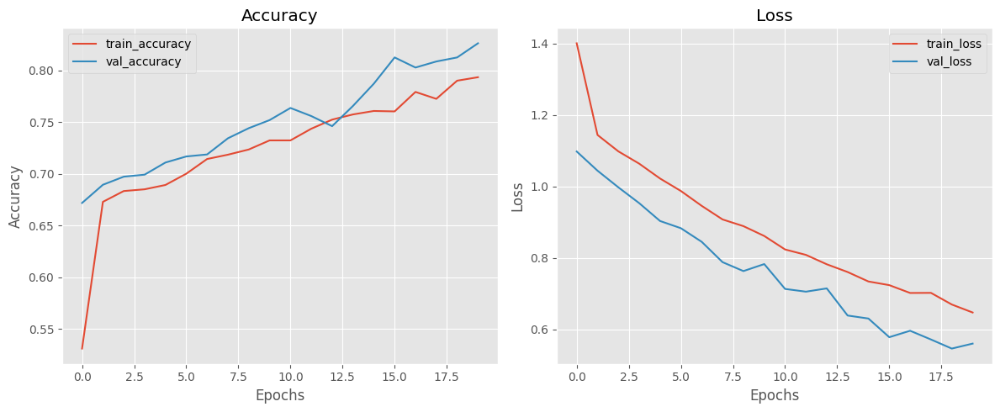

In [ ]:
plotTrainingHistory(historyModel3Grouped)

## model3Grouped Implementation Notes and Results:

With 10 weeks:

- The model produces optimal results after applying class grouping, including smoothed weights.
- Accuracy is high at 0.8, and the F1-score is 0.51, in a medium range. It does not ignore classes :)
- There is good convergence at epoch 12.
- The proposed architecture change was effective.


## Prediction Result
---


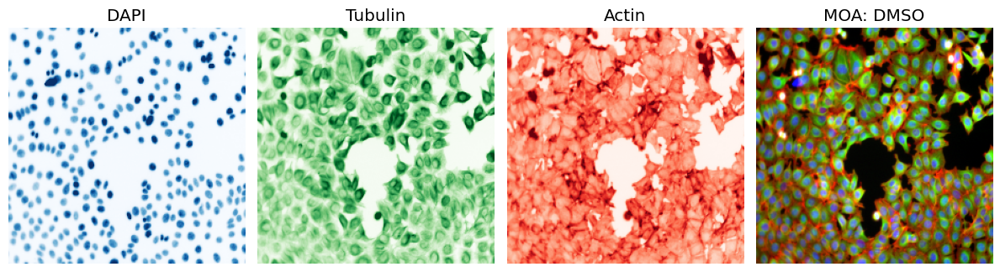

Index: 5
Clase real: DMSO
Clase predicha: DMSO


In [ ]:
predictSample( model=model3Grouped,rowIndex=5,labelEncoder=labelEncoderGrouped,predictFrom="tensor",X=XTest,showCuarteto=True,yEncoded=yTestEncGrouped);

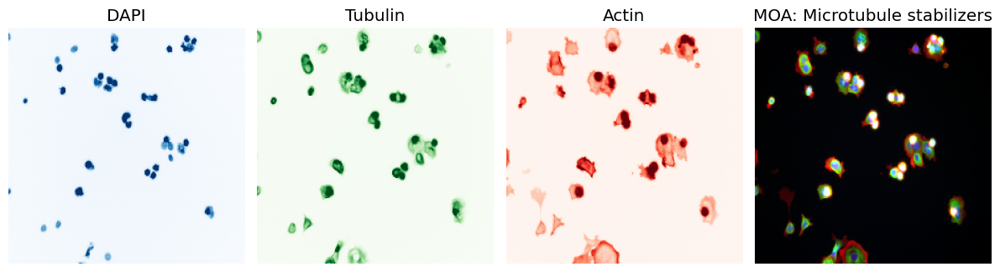

Index: 11
Clase real: Microtubule stabilizers
Clase predicha: Microtubule stabilizers


In [ ]:
predictSample( model=model3Grouped,rowIndex=11,labelEncoder=labelEncoderGrouped,predictFrom="tensor",X=XTest,showCuarteto=True,yEncoded=yTestEncGrouped);

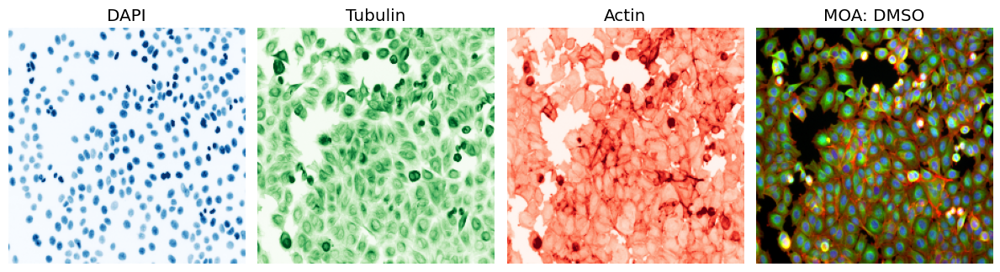

Index: 64
Clase real: DMSO
Clase predicha: DMSO


In [ ]:
predictSample( model=model3Grouped,rowIndex=64,labelEncoder=labelEncoderGrouped,predictFrom="tensor",X=XTest,showCuarteto=True,yEncoded=yTestEncGrouped);

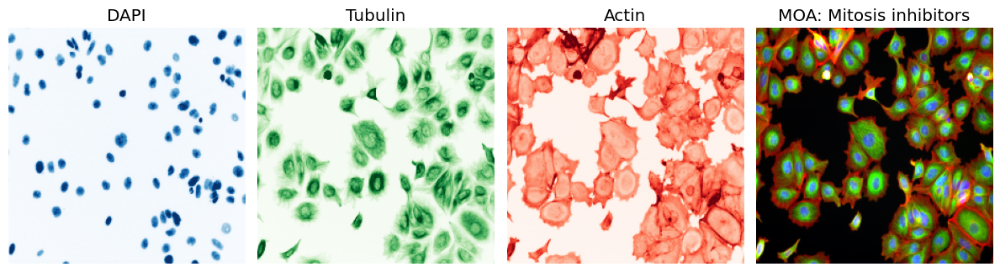

Index: 53
Clase real: Mitosis inhibitors
Clase predicha: Mitosis inhibitors


In [ ]:
predictSample( model=model3Grouped,rowIndex=53,labelEncoder=labelEncoderGrouped,predictFrom="tensor",X=XTest,showCuarteto=True,yEncoded=yTestEncGrouped);

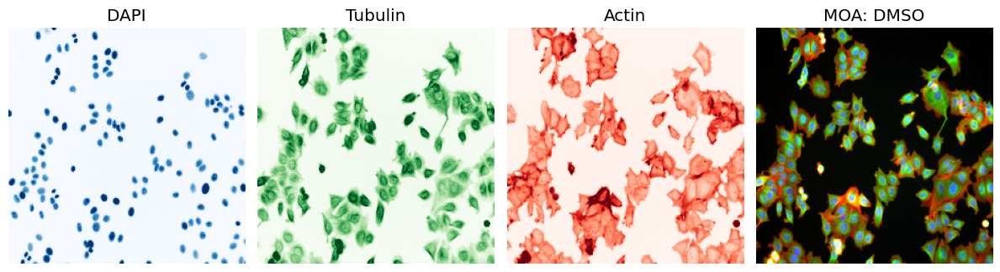

Index: 60
Clase real: DMSO
Clase predicha: DMSO


In [ ]:
predictSample( model=model3Grouped,rowIndex=60,labelEncoder=labelEncoderGrouped,predictFrom="tensor",X=XTest,showCuarteto=True,yEncoded=yTestEncGrouped);

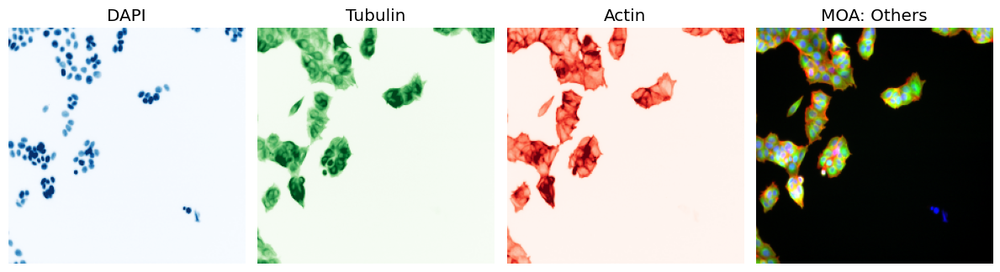

Index: 120
Clase real: Others
Clase predicha: Others


In [ ]:
predictSample( model=model3Grouped,rowIndex=120,labelEncoder=labelEncoderGrouped,predictFrom="tensor",X=XTest,showCuarteto=True,yEncoded=yTestEncGrouped);


### Conclusions:

- Noise that simulates laboratory experimental conditions is very important. Although high accuracy and F1-score values can be obtained without including noise, this is not realistic; including it makes the model not only more realistic but also more robust.
- It is also important to include class weights to balance minority classes, with smoothing when appropriate.
- The strategy of including class grouping was effective.
- There are various biology-specific factors at the cellular level that are worth analyzing in a more detailed study, for example by studying individual channels.